Environment: `velocity`

In [1]:
import scanpy
import anndata
import matplotlib
from matplotlib import pyplot
import hdf5plugin
import numpy
import scvelo
import seaborn
import pandas
import warnings
import cellrank
import gseapy
import decoupler
import IPython
import textwrap

import single_cell_analysis

In [2]:
# Scanpy plotting setup

scanpy.set_figure_params(dpi=300)

In [38]:
# Suppress warnings

warnings.simplefilter("ignore", category=UserWarning)

In [19]:
# Read input file
working_directory = "RNA Sequencing Data/"

# adata = scanpy.read_h5ad(working_directory + "/velocity_sdevelo.h5ad")

# Or read saved anndata objects
working_directory = "RNA Sequencing Data/"
base_name = "cellrank_version_5"
adata = scanpy.read_h5ad(
    working_directory+f"/{base_name}_anndata.h5ad"
)
driver_df = pandas.read_csv(
    working_directory+f"{base_name}_driver_genes.csv",
    index_col=0
)
combined_driver_df = pandas.read_csv(
    working_directory+f"{base_name}_driver_genes_combined.csv",
    index_col=0
)

In [4]:
# Read ChIP-seq targets
base_name = "ChIP Sequencing Data/chipseq_targets"

hic2_target_scores = pandas.read_csv(f"{base_name}_hic2_scores.csv", index_col=0)
klf4_hic2_target_scores = pandas.read_csv(f"{base_name}_klf4_hic2_scores.csv", index_col=0)
klf4_control_target_scores = pandas.read_csv(f"{base_name}_klf4_control_scores.csv", index_col=0)

hic2_targets = numpy.loadtxt(f"{base_name}_hic2_targets.txt", dtype=numpy.dtypes.StrDType)
klf4_hic2_targets = numpy.loadtxt(f"{base_name}_klf4_hic2_targets.txt", dtype=numpy.dtypes.StrDType)
klf4_control_targets = numpy.loadtxt(f"{base_name}_klf4_control_targets.txt", dtype=numpy.dtypes.StrDType)
klf4_targets = numpy.intersect1d(klf4_hic2_targets, klf4_control_targets)
shared_targets = numpy.intersect1d(hic2_targets, klf4_targets)

In [5]:
# Load bulk differential expression results

bulk_de = pandas.read_csv("RNA Sequencing Data/bulk_differential_expression_combined.csv", index_col=0)
bulk_metadata = pandas.read_csv("RNA Sequencing Data/bulk_sequencing_metadata.csv", index_col=0)
samples = bulk_metadata.index.to_list()
reprogramming_columns = bulk_de.columns[bulk_de.columns.str.contains("Reprogramming")]
reprogramming_de = pandas.read_csv("RNA Sequencing Data/bulk_differential_expression_reprogramming.csv", index_col=0)
mef_de = pandas.read_csv("RNA Sequencing Data/bulk_differential_expression_mef.csv", index_col=0)
mesc_de = pandas.read_csv("RNA Sequencing Data/bulk_differential_expression_mesc.csv", index_col=0)
ipsc_de = pandas.read_csv("RNA Sequencing Data/bulk_differential_expression_ipsc.csv", index_col=0)

In [7]:
# Variable genes and Cellrank drivers
variable_genes = adata.var_names.to_numpy()
variable_in_bulk = numpy.intersect1d(variable_genes, bulk_de.index.to_numpy())
stem_cell_drivers = driver_df.sort_values("Dead end_corr", ascending=True).head(100).index.to_numpy()
dead_end_drivers = driver_df.sort_values("Dead end_corr", ascending=False).head(100).index.to_numpy()
differentially_expressed_genes = reprogramming_de.loc[variable_in_bulk].query("padj < 0.05").index.to_numpy()

In [ ]:
# Load list of transcription factors

tf_df = pandas.read_csv("ChIP Sequencing Data/Mus_musculus_TF.txt", sep="\t")
tf_array = tf_df["Symbol"].to_numpy()

# All target transcription factors
target_tfs = numpy.intersect1d(shared_targets, tf_array)

# Target transcription factors for which Hic2 changes expression significantly
de_target_tfs = numpy.intersect1d(target_tfs, differentially_expressed_genes)

de_dead_end_drivers = numpy.intersect1d(de_target_tfs, dead_end_drivers)
de_stem_cell_drivers = numpy.intersect1d(de_target_tfs, stem_cell_drivers)

genes_of_interest = de_dead_end_drivers.tolist() + de_stem_cell_drivers.tolist() + ["Klf4", "Myc", "Hic2", "Cdh1", "Atf3"]

In [14]:
# Define macrostates

macrostates = adata.obs["macrostate"].cat.categories

In [11]:
# Show all possible libraries
names = gseapy.get_library_name(organism="Mouse")
print(names)

['ARCHS4_Cell-lines', 'ARCHS4_IDG_Coexp', 'ARCHS4_Kinases_Coexp', 'ARCHS4_TFs_Coexp', 'ARCHS4_Tissues', 'Achilles_fitness_decrease', 'Achilles_fitness_increase', 'Aging_Perturbations_from_GEO_down', 'Aging_Perturbations_from_GEO_up', 'Allen_Brain_Atlas_10x_scRNA_2021', 'Allen_Brain_Atlas_down', 'Allen_Brain_Atlas_up', 'Azimuth_2023', 'Azimuth_Cell_Types_2021', 'BioCarta_2013', 'BioCarta_2015', 'BioCarta_2016', 'BioPlanet_2019', 'BioPlex_2017', 'CCLE_Proteomics_2020', 'CM4AI_U2OS_Protein_Localization_Assemblies', 'COMPARTMENTS_Curated_2025', 'COMPARTMENTS_Experimental_2025', 'CORUM', 'COVID-19_Related_Gene_Sets', 'COVID-19_Related_Gene_Sets_2021', 'Cancer_Cell_Line_Encyclopedia', 'Carcinogenome', 'CellMarker_2024', 'CellMarker_Augmented_2021', 'ChEA_2013', 'ChEA_2015', 'ChEA_2016', 'ChEA_2022', 'Chromosome_Location', 'Chromosome_Location_hg19', 'ClinVar_2019', 'ClinVar_2025', 'DGIdb_Drug_Targets_2024', 'DSigDB', 'Data_Acquisition_Method_Most_Popular_Genes', 'DepMap_CRISPR_GeneDependency

Databases available in Decoupler: https://omnipathdb.org/info.html

In [12]:
# Load databases

collectri_df = decoupler.op.collectri(organism="mouse")
progeny_df = decoupler.op.progeny(organism="mouse")
hallmark_df = decoupler.op.hallmark(organism="mouse")

# Differential expression analysis with Scanpy

Scanpy uses a Wilcoxon rank sum test.

# Comparison between macrostates

In [26]:
# perform differential expression using the standard wilcoxon rank-sum test

scanpy.tl.rank_genes_groups(
    adata,
    groupby="macrostate",
    method="wilcoxon",
    key_added="macrostate_rank_genes",
    use_raw=False
)

rank_dfs = {}

# extract the results into a dataframe for a specific target macrostate
for macrostate in macrostates:
    rank_df = scanpy.get.rank_genes_groups_df(
        adata,
        key="macrostate_rank_genes",
        group=macrostate
    )
    rank_df.index = rank_df["names"]
    rank_df = rank_df.drop(columns="names")
    rank_dfs[macrostate] = rank_df

In [27]:
dead_end_drivers = ['Dmrtc2', 'Myc', 'Ovol1', 'Tlx2', 'Zbtb7c', 'Cdh1', "Hic2", "Klf4"]

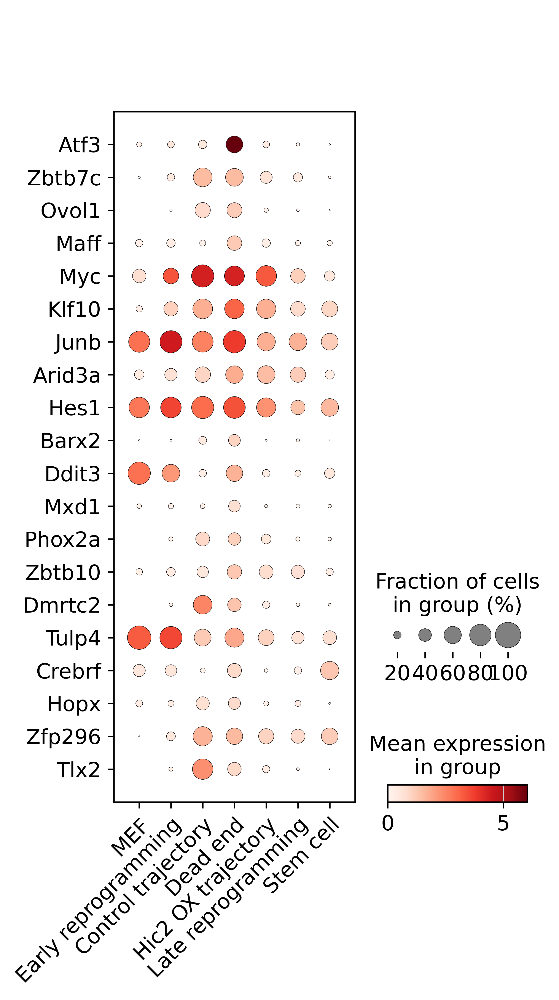

In [28]:
# Most upregulated transcription factors in dead end

top_tfs = rank_dfs["Dead end"].loc[numpy.intersect1d(tf_array, adata.var_names)].sort_values("scores", ascending=False).head(20)
axis = scanpy.pl.dotplot(adata, top_tfs.index, "macrostate", swap_axes=True, show=False)["mainplot_ax"]
axis.set_xticklabels(axis.get_xticklabels(), rotation=45, rotation_mode="anchor", ha="right")
figure = pyplot.gcf()
pyplot.show()


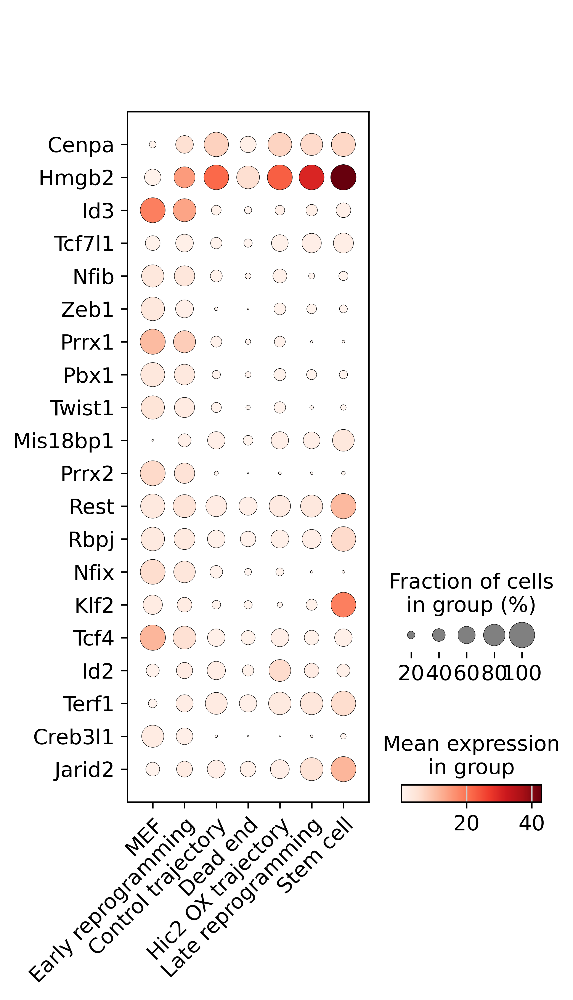

In [127]:
# Most downregulated transcription factors in dead end

top_tfs = rank_dfs["Dead end"].loc[numpy.intersect1d(tf_array, adata.var_names)].sort_values("scores", ascending=True).head(20)
axis = scanpy.pl.dotplot(adata, top_tfs.index, "macrostate", swap_axes=True, show=False)["mainplot_ax"]
axis.set_xticklabels(axis.get_xticklabels(), rotation=45, rotation_mode="anchor", ha="right")
figure = pyplot.gcf()
pyplot.show()


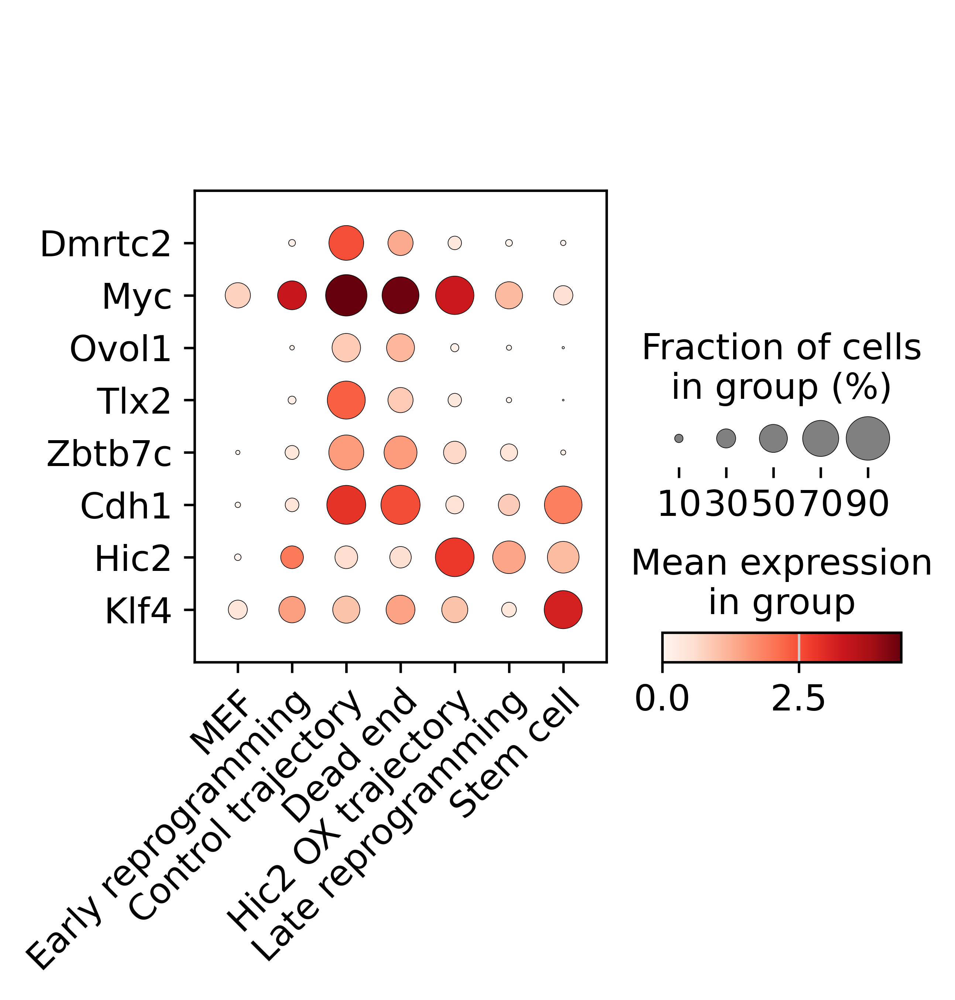

In [29]:
# Dead end driver dot plot

axis = scanpy.pl.dotplot(adata, dead_end_drivers, "macrostate", swap_axes=True, show=False)["mainplot_ax"]
axis.set_xticklabels(axis.get_xticklabels(), rotation=45, rotation_mode="anchor", ha="right")
figure = pyplot.gcf()
pyplot.show()

2026-03-12 16:28:22,813 [WARNING] Duplicated values found in preranked stats: 2.90% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-12 16:28:23,028 [WARNING] Duplicated values found in preranked stats: 0.05% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-12 16:28:23,311 [WARNING] Duplicated values found in preranked stats: 0.80% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-12 16:28:23,593 [WARNING] Duplicated values found in preranked stats: 1.80% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-12 16:28:23,853 [WARNING] Duplicated values found in preranked stats: 0.75% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-12 16:28:24,072 [WARNING] Duplicated values found in preranked stats: 0.70% of genes
The order of those genes will be

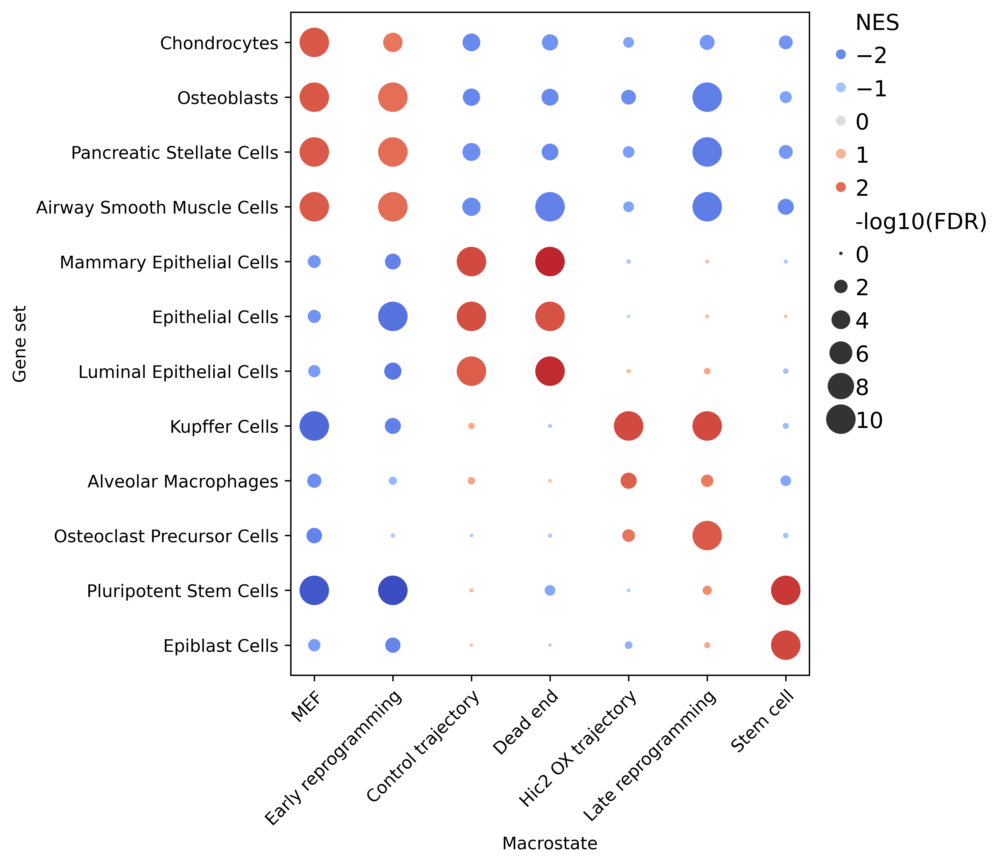

In [58]:
# Cell types

single_cell_analysis.compare_gsea(adata, gene_set="PanglaoDB_Augmented_2021", group_key="macrostate", n_top_terms=2, significance_cutoff=1)

2026-03-12 16:28:35,342 [WARNING] Duplicated values found in preranked stats: 2.90% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-12 16:28:35,531 [WARNING] Duplicated values found in preranked stats: 0.05% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-12 16:28:35,741 [WARNING] Duplicated values found in preranked stats: 0.80% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-12 16:28:35,940 [WARNING] Duplicated values found in preranked stats: 1.80% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-12 16:28:36,143 [WARNING] Duplicated values found in preranked stats: 0.75% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-12 16:28:36,349 [WARNING] Duplicated values found in preranked stats: 0.70% of genes
The order of those genes will be

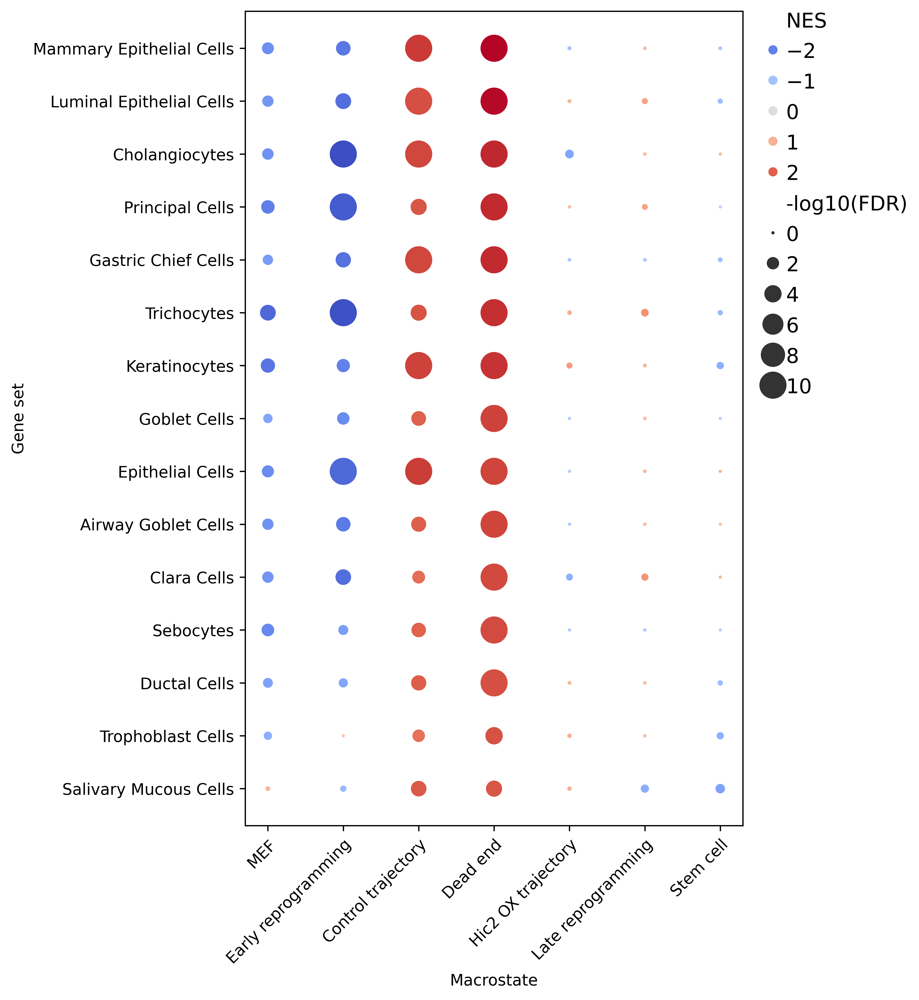

In [59]:
# Cell types in dead end

single_cell_analysis.compare_gsea(adata, gene_set="PanglaoDB_Augmented_2021", group_key="macrostate", top_from="Dead end", n_top_terms=15)

2026-03-12 15:21:20,620 [WARNING] Duplicated values found in preranked stats: 2.95% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-12 15:21:22,377 [WARNING] Duplicated values found in preranked stats: 0.10% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-12 15:21:24,026 [WARNING] Duplicated values found in preranked stats: 0.85% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-12 15:21:25,660 [WARNING] Duplicated values found in preranked stats: 1.90% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-12 15:21:27,053 [WARNING] Duplicated values found in preranked stats: 0.75% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-12 15:21:28,272 [WARNING] Duplicated values found in preranked stats: 0.70% of genes
The order of those genes will be

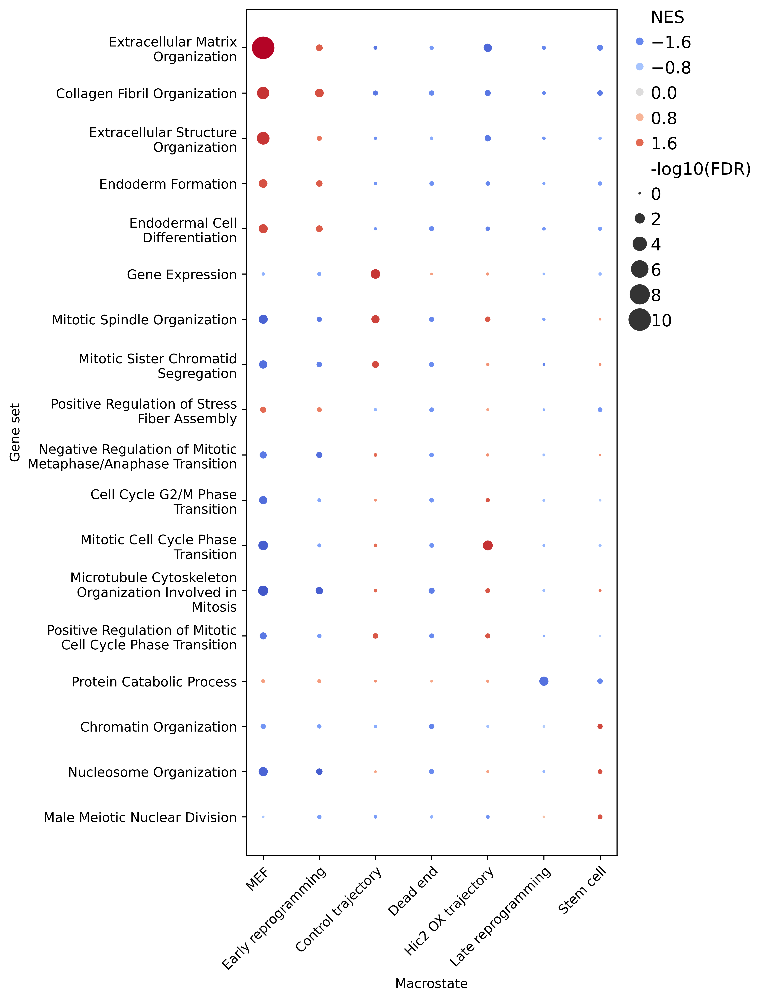

In [35]:
# GO terms

single_cell_analysis.compare_gsea(adata, gene_set="GO_Biological_Process_2025", group_key="macrostate", n_top_terms=3, top_from="all",
                                   significance_cutoff=0.5, remove_parenthesis = True)

2026-03-12 15:21:32,934 [WARNING] Duplicated values found in preranked stats: 2.95% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-12 15:21:34,115 [WARNING] Duplicated values found in preranked stats: 0.10% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-12 15:21:35,326 [WARNING] Duplicated values found in preranked stats: 0.85% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-12 15:21:37,919 [WARNING] Duplicated values found in preranked stats: 1.90% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-12 15:21:39,113 [WARNING] Duplicated values found in preranked stats: 0.75% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-12 15:21:40,289 [WARNING] Duplicated values found in preranked stats: 0.70% of genes
The order of those genes will be

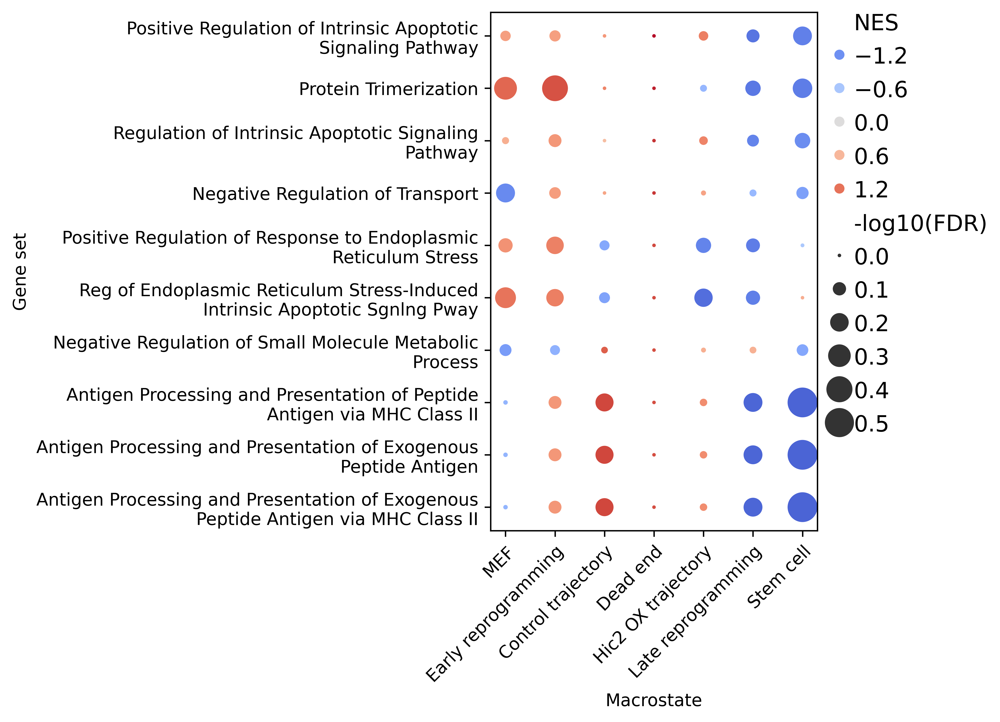

In [36]:
# GO terms in dead end

single_cell_analysis.compare_gsea(adata, gene_set="GO_Biological_Process_2025", group_key="macrostate", n_top_terms=10, top_from="Dead end",
                                   significance_cutoff=1, remove_parenthesis = True, wrap_width=50, sort_key="NES")

In [40]:
from importlib import reload

single_cell_analysis = reload(single_cell_analysis)

2026-03-12 15:36:06,515 [WARNING] Duplicated values found in preranked stats: 2.95% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-12 15:36:06,608 [WARNING] Duplicated values found in preranked stats: 0.10% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-12 15:36:06,704 [WARNING] Duplicated values found in preranked stats: 0.85% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-12 15:36:06,804 [WARNING] Duplicated values found in preranked stats: 1.90% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-12 15:36:06,892 [WARNING] Duplicated values found in preranked stats: 0.75% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-12 15:36:06,986 [WARNING] Duplicated values found in preranked stats: 0.70% of genes
The order of those genes will be

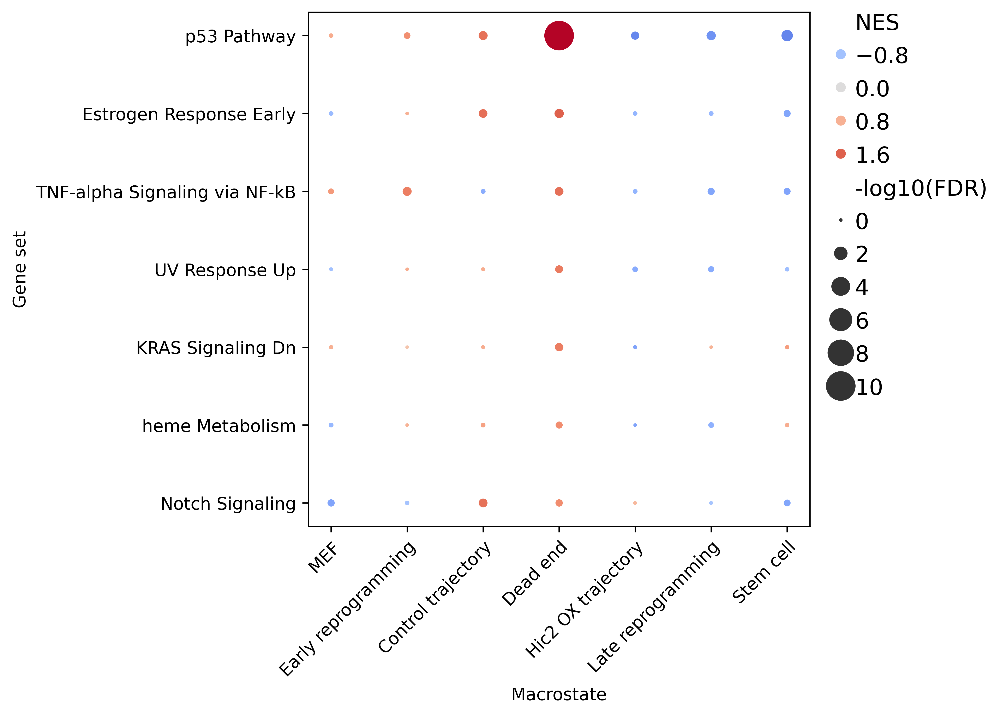

In [43]:
# Msig hallmarks in dead end

single_cell_analysis.compare_gsea(adata, gene_set="MSigDB_Hallmark_2020", group_key="macrostate", n_top_terms=10, top_from="Dead end",
                                   significance_cutoff=0.5, remove_parenthesis = True)

2026-03-12 15:41:45,322 [WARNING] Duplicated values found in preranked stats: 2.95% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-12 15:41:46,783 [WARNING] Duplicated values found in preranked stats: 0.10% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-12 15:41:46,908 [WARNING] Duplicated values found in preranked stats: 0.85% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-12 15:41:47,027 [WARNING] Duplicated values found in preranked stats: 1.90% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-12 15:41:47,150 [WARNING] Duplicated values found in preranked stats: 0.75% of genes
The order of those genes will be arbitrary, which may produce unexpected results.
2026-03-12 15:41:47,262 [WARNING] Duplicated values found in preranked stats: 0.70% of genes
The order of those genes will be

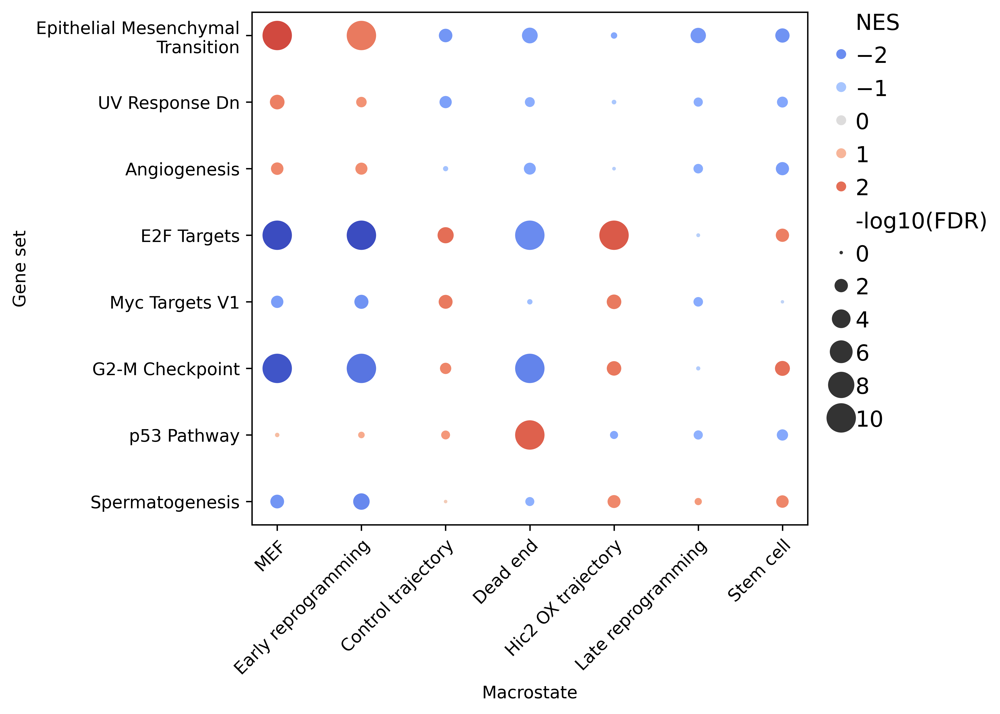

In [49]:
# Msig hallmarks in all

single_cell_analysis.compare_gsea(adata, gene_set="MSigDB_Hallmark_2020", group_key="macrostate", n_top_terms=3, top_from="all",
                                   significance_cutoff=0.1, remove_parenthesis = True)

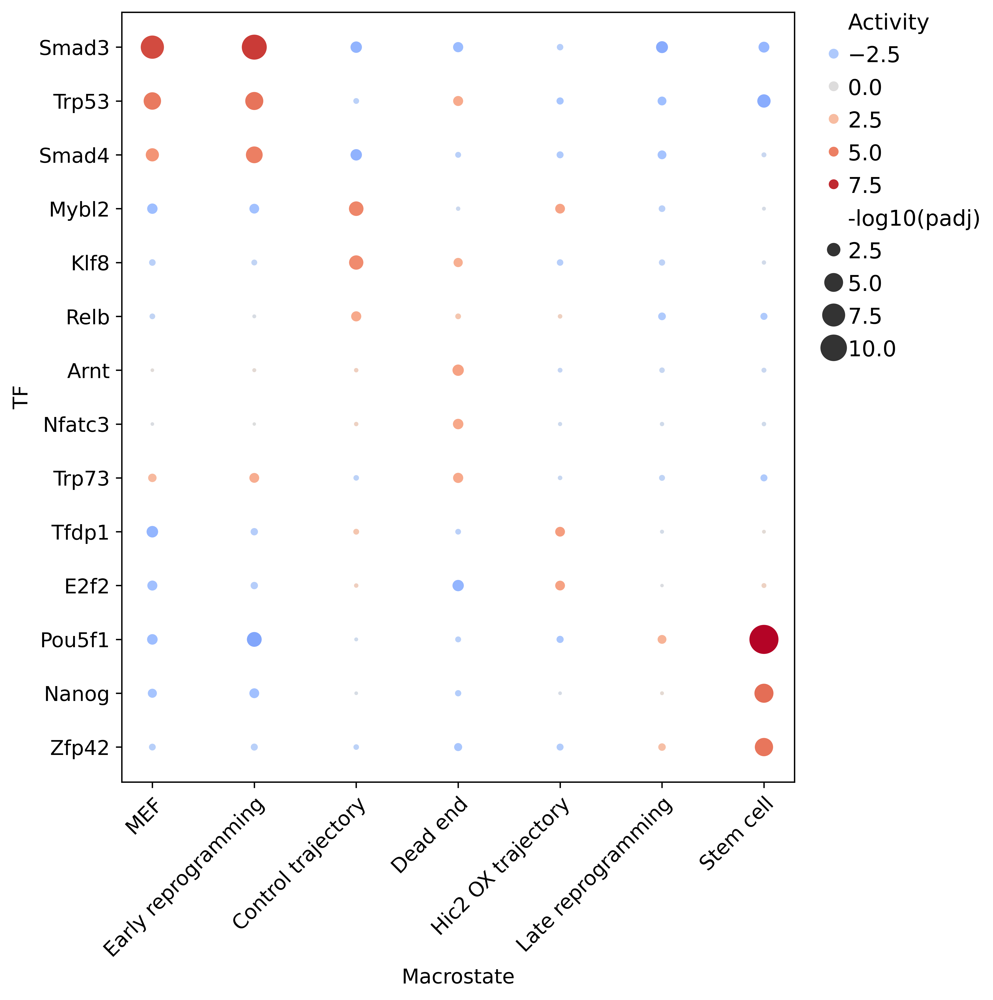

In [44]:
# Compare TFs in macrostates

single_cell_analysis.plot_tf_activity(adata, network=collectri_df, n_top = 3, activity_cutoff = 0, significance_cutoff = 0.1)

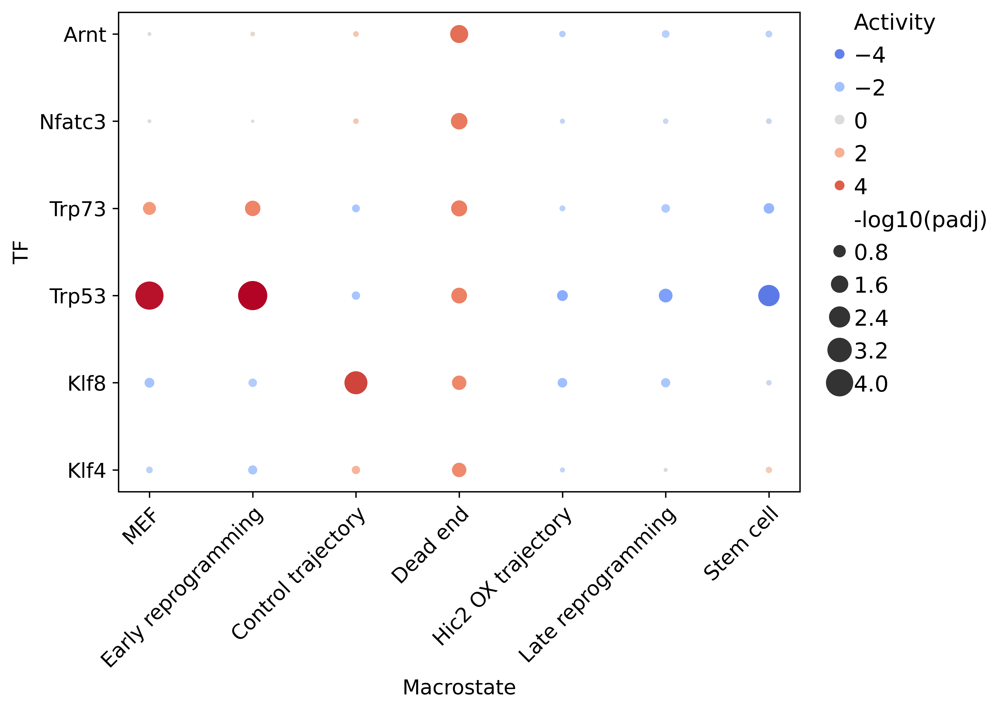

In [45]:
# TFs in dead end

single_cell_analysis.plot_tf_activity(adata, network=collectri_df, n_top = 20, top_from="Dead end", significance_cutoff=0.1, activity_cutoff=0)

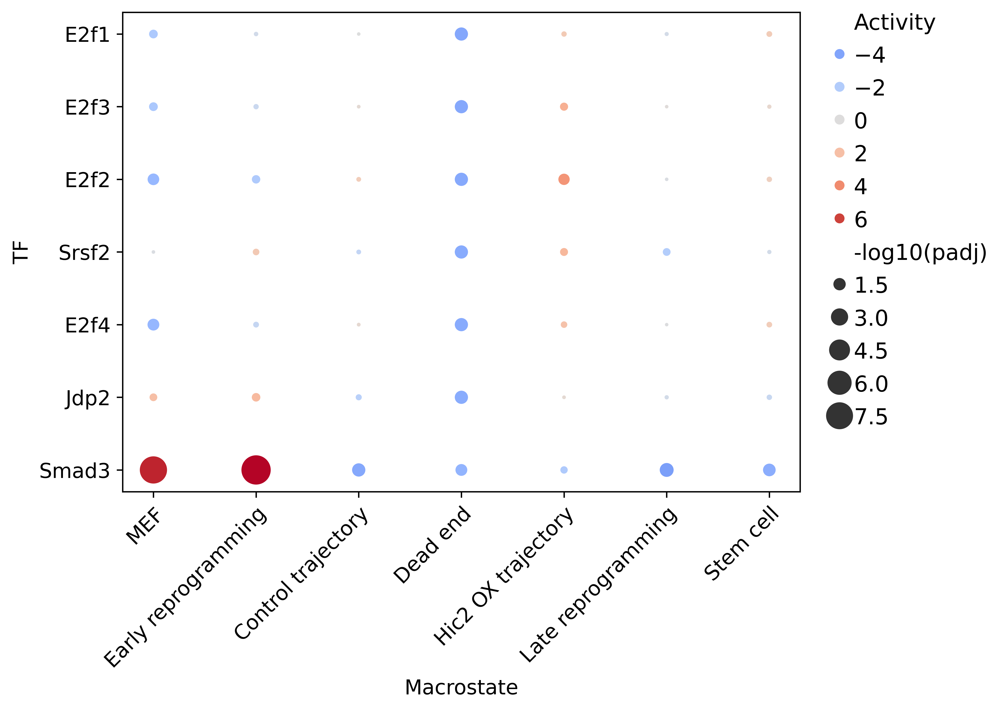

In [52]:
# TFs with low activity in dead end

single_cell_analysis.plot_tf_activity(adata, network=collectri_df, n_top = 20, top_from="Dead end", significance_cutoff=0.1, activity_cutoff=0, reverse=True)

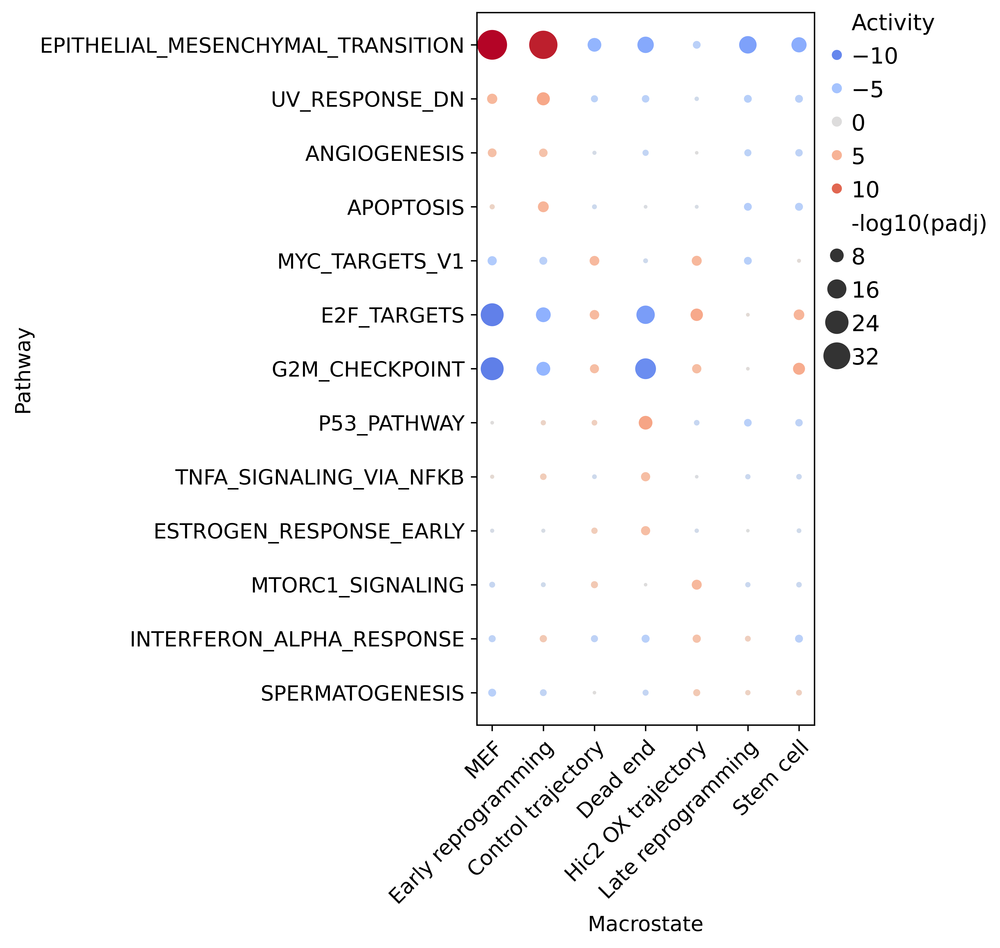

In [53]:
# Pathways in all macrostates

single_cell_analysis.plot_tf_activity(adata, network=hallmark_df, n_top = 3, activity_cutoff = 0, significance_cutoff = 0.1, pathway_key = "Pathway")

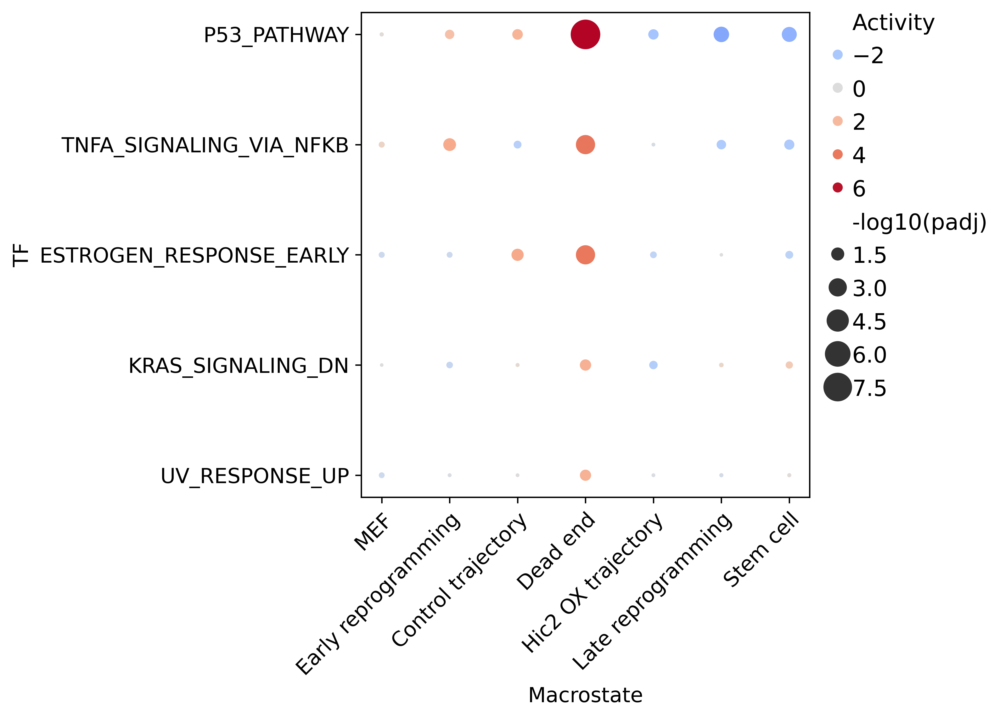

In [54]:
# Pathways in dead end

single_cell_analysis.plot_tf_activity(adata, network=hallmark_df, n_top = 10, top_from="Dead end", significance_cutoff=0.1, activity_cutoff=0)

## Dead end state

In [60]:
# Most upregulated genes

dead_end_rank_df = rank_dfs["Dead end"]
dead_end_rank_df.head(20)

,scores,logfoldchanges,pvals,pvals_adj
names,,,,
Zfas1,28.458973,2.232943,3.773779e-178,7.547557e-175
2410006H16Rik,27.454758,1.888420,6.095933e-166,6.095933e-163
Ctsd,26.458736,2.123187,2.894872e-154,1.929915e-151
Lgals7,25.714161,3.957618,8.117870e-146,4.058935e-143
Crb3,25.299303,2.791847,3.251091e-141,1.300436e-138
Krt8,24.376291,3.330821,3.051904e-131,8.719727e-129
Perp,24.088524,2.218825,3.297489e-128,8.243723e-126
Spint2,23.946939,2.108541,9.944225e-127,2.209828e-124
Snhg1,23.873329,2.028821,5.797887e-126,1.159577e-123


In [61]:
# Most upregulated transcription factors in dead end

dead_end_rank_df.loc[numpy.intersect1d(tf_array, adata.var_names)].sort_values("scores", ascending=False).head(30)

,scores,logfoldchanges,pvals,pvals_adj
names,,,,
Atf3,17.390110,4.089899,9.804607e-68,3.016802e-66
Zbtb7c,14.612451,1.973121,2.339487e-48,3.599212e-47
Ovol1,13.720193,2.777083,7.686031e-43,1.018017e-41
Maff,12.807600,2.751845,1.486617e-37,1.607154e-36
Myc,12.511089,1.459926,6.492776e-36,6.605903e-35
Klf10,12.425893,1.525154,1.891029e-35,1.891029e-34
Junb,11.793038,1.147724,4.239668e-32,3.702767e-31
Arid3a,11.701237,1.506314,1.256091e-31,1.064484e-30
Hes1,10.985732,1.063547,4.475926e-28,3.174415e-27


Really exciting! Many top TFs are involved in stress response, suggesting that this macrostate corresponds to damaged cells.

In [62]:
# Most upregulated transcription factors in dead end that are shared targets

dead_end_rank_df.loc[numpy.intersect1d(target_tfs, adata.var_names)].sort_values("scores", ascending=False).head(30)

,scores,logfoldchanges,pvals,pvals_adj
names,,,,
Zbtb7c,14.612451,1.973121,2.339487e-48,3.599212e-47
Ovol1,13.720193,2.777083,7.686031e-43,1.018017e-41
Myc,12.511089,1.459926,6.492776e-36,6.605903e-35
Klf10,12.425893,1.525154,1.891029e-35,1.891029e-34
Junb,11.793038,1.147724,4.239668e-32,3.702767e-31
Arid3a,11.701237,1.506314,1.256091e-31,1.064484e-30
Barx2,10.685104,3.323045,1.195144e-26,7.888742e-26
Ddit3,10.194303,1.482505,2.102483e-24,1.266556e-23
Mxd1,9.994449,3.053876,1.611811e-23,9.184110e-23


In [63]:
# Most downregulated transcription factors in dead end

dead_end_rank_df.loc[numpy.intersect1d(tf_array, adata.var_names)].sort_values("scores", ascending=True).head(30)

,scores,logfoldchanges,pvals,pvals_adj
names,,,,
Cenpa,-16.446115,-1.664195,8.942223e-61,2.104052e-59
Hmgb2,-14.552638,-1.363486,5.619370e-48,8.450181e-47
Id3,-13.267100,-2.642051,3.592148e-40,4.276367e-39
Tcf7l1,-11.806723,-1.485039,3.603348e-32,3.160831e-31
Nfib,-11.713265,-2.224971,1.089992e-31,9.356154e-31
Zeb1,-11.589153,-4.036397,4.677352e-31,3.802725e-30
Prrx1,-11.505573,-2.951197,1.236649e-30,9.814671e-30
Pbx1,-10.905756,-2.169205,1.081907e-27,7.565786e-27
Twist1,-10.875159,-2.422398,1.513906e-27,1.051324e-26


In [64]:
dead_end_rank_df.loc[dead_end_drivers].sort_values("scores", ascending=False)

,scores,logfoldchanges,pvals,pvals_adj
names,,,,
Cdh1,17.346001,1.832915,2.114630e-67,6.312327e-66
Zbtb7c,14.612451,1.973121,2.339487e-48,3.599212e-47
Ovol1,13.720193,2.777083,7.686031e-43,1.018017e-41
Myc,12.511089,1.459926,6.492776e-36,6.605903e-35
Dmrtc2,8.396849,1.533345,4.586215e-17,2.015919e-16
Tlx2,7.353558,1.157640,1.929997e-13,6.905176e-13
Klf4,4.388733,0.652578,1.140128e-05,2.425803e-05
Hic2,-4.371024,-0.510116,1.236653e-05,2.617256e-05


In [65]:
dead_end_rank_df.loc[genes_of_interest].sort_values("scores", ascending=False)

,scores,logfoldchanges,pvals,pvals_adj
names,,,,
Atf3,17.390110,4.089899,9.804607e-68,3.016802e-66
Cdh1,17.346001,1.832915,2.114630e-67,6.312327e-66
Zbtb7c,14.612451,1.973121,2.339487e-48,3.599212e-47
Ovol1,13.720193,2.777083,7.686031e-43,1.018017e-41
Myc,12.511089,1.459926,6.492776e-36,6.605903e-35
Tlx2,7.353558,1.157640,1.929997e-13,6.905176e-13
Klf4,4.388733,0.652578,1.140128e-05,2.425803e-05
Hic2,-4.371024,-0.510116,1.236653e-05,2.617256e-05
Zfp42,-5.850094,-1.078539,4.912956e-09,1.337761e-08


In [66]:
# Cell types in the dead end

pre_res = gseapy.prerank(
    rnk=dead_end_rank_df[["scores"]], 
    gene_sets="PanglaoDB_Augmented_2021",
    threads=32,
    min_size=5,
    max_size=1000
)
pre_res.res2d.sort_values("NES", ascending=False).head(20)

2026-03-12 17:00:20,536 [WARNING] Duplicated values found in preranked stats: 1.80% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,Mammary Epithelial Cells,0.780298,2.66939,0.0,0.0,0.0,21/43,8.25%,Krt8;Perp;Krt17;S100a14;Dsp;S100a16;Lad1;Necti...
1,prerank,Luminal Epithelial Cells,0.779825,2.631357,0.0,0.0,0.0,21/40,8.25%,Crb3;Krt8;Perp;Aqp3;S100a14;Dsp;Lad1;Btg1;Nect...
2,prerank,Cholangiocytes,0.789001,2.498076,0.0,0.0,0.0,15/28,8.10%,Crb3;Krt8;S100a14;Lad1;Cdh1;Mal2;Rab25;St14;Cl...
3,prerank,Principal Cells,0.770034,2.480283,0.0,0.0,0.0,15/31,8.10%,Aqp3;S100a14;Dsp;Lad1;Cdh1;Mal2;Rab25;Cldn7;It...
4,prerank,Gastric Chief Cells,0.858723,2.470227,0.0,0.0,0.0,10/20,3.25%,Crb3;S100a14;Dsp;Lad1;Spint1;Cdh1;Mal2;Rab25;S...
5,prerank,Trichocytes,0.794874,2.436164,0.0,0.0,0.0,17/28,12.90%,Krt8;Perp;Krt17;S100a14;Dsp;S100a16;Lad1;Itgb4...
6,prerank,Keratinocytes,0.731534,2.40409,0.0,0.0,0.0,26/37,20.00%,Lgals7;Perp;Aqp3;Krt17;S100a14;Lad1;Nectin4;It...
7,prerank,Goblet Cells,0.789906,2.285105,0.0,0.0,0.0,9/20,5.90%,Krt8;Aqp3;S100a14;Lad1;Rab25;Cldn7;Misp;Gpx2;E...
8,prerank,Epithelial Cells,0.615117,2.256382,0.0,0.0,0.0,24/66,8.30%,Crb3;Krt8;Aqp3;S100a14;Lad1;Spint1;Nectin4;Cdh...
9,prerank,Airway Goblet Cells,0.777637,2.253971,0.0,0.0,0.0,9/21,5.90%,S100a14;Lad1;Nectin4;Cdh1;Rab25;Cldn7;Misp;Gpx...


In [67]:
# MSig Hallmarks in dead end

pre_res = gseapy.prerank(
    rnk=dead_end_rank_df[["scores"]], 
    gene_sets="MSigDB_Hallmark_2020",
    threads=32,
    min_size=5,
    max_size=1000
)
pre_res.res2d.sort_values("NES", ascending=False).head(20)[["Term", "NES", "FDR q-val", "Lead_genes"]]

2026-03-12 17:00:26,843 [WARNING] Duplicated values found in preranked stats: 1.80% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


,Term,NES,FDR q-val,Lead_genes
0,p53 Pathway,2.379013,0.0,Ctsd;Perp;Krt17;Cdkn1a;Tob1;Ppp1r15a;Btg2;Sat1...
5,TNF-alpha Signaling via NF-kB,1.860944,0.024878,Cdkn1a;Ppp1r15a;Btg2;Sat1;Btg1;Atf3;Sqstm1;Gch...
6,Estrogen Response Early,1.74181,0.045091,Krt8;Aqp3;Tob1;Ablim1;Lad1;Cldn7;Klk10;Myc;Klf...
8,mTORC1 Signaling,1.535319,0.178808,Cdkn1a;Ppp1r15a;Btg2;Ifrd1;Cd9;Sqstm1;Nupr1;Dd...
9,Notch Signaling,1.515761,0.165747,Dtx2;Hes1;Notch1
10,UV Response Up,1.510142,0.14486,Aqp3;Btg2;Btg1;Atf3;Sqstm1;Gch1;Junb;Epcam;Tub...
14,heme Metabolism,1.366562,0.305417,Aqp3;Btg2;Myl4;Ctsb;Mgst3;Lamp2
15,Estrogen Response Late,1.353553,0.288425,Perp;Tob1;Klk11;Cd9;Cdh1;St14;Klk10;Homer2;Lsr...
16,KRAS Signaling Dn,1.287588,0.367809,Lgals7;Btg2;Alox12b
19,Androgen Response,1.235101,0.431005,Krt8;Sat1;Ndrg1;Akap12;Homer2;Zbtb10;B2m;Dnajb...


In [68]:
# GO biological process in dead end

pre_res = gseapy.prerank(
    rnk=dead_end_rank_df[["scores"]], 
    gene_sets="GO_Biological_Process_2025",
    threads=32,
    min_size=5,
    max_size=1000
)
pre_res.res2d.sort_values("NES", ascending=False).head(20)[["Term", "NES", "NOM p-val", "FWER p-val", "FDR q-val"]]

2026-03-12 17:00:29,286 [WARNING] Duplicated values found in preranked stats: 1.80% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


,Term,NES,NOM p-val,FWER p-val,FDR q-val
1,Regulation of Autophagy (GO:0010506),1.794659,0.002801,0.792,1.0
5,Gene Expression (GO:0010467),1.738074,0.008671,0.933,1.0
6,Positive Regulation of Intrinsic Apoptotic Sig...,1.736195,0.005222,0.937,1.0
8,Antigen Processing and Presentation of Exogeno...,1.714288,0.015544,0.97,0.64086
9,Antigen Processing and Presentation of Peptide...,1.714288,0.015544,0.97,0.64086
10,Antigen Processing and Presentation of Exogeno...,1.714288,0.015544,0.97,0.64086
13,Protein Catabolic Process (GO:0030163),1.691452,0.018421,0.987,0.694969
14,Intracellular Iron Ion Homeostasis (GO:0006879),1.67415,0.031088,0.993,0.724414
15,Positive Regulation of Sprouting Angiogenesis ...,1.66707,0.010554,0.996,0.688628
24,Regulation of Intrinsic Apoptotic Signaling Pa...,1.613208,0.028721,0.999,0.987947


In [69]:
# TFs whose targets are upregulated in dead end, perturbation followed by expression
pre_res = gseapy.prerank(
    rnk=dead_end_rank_df[["scores"]], 
    gene_sets="TF_Perturbations_Followed_by_Expression",
    threads=32,
    min_size=5,
    max_size=1000
)
print("Top")
IPython.display.display(pre_res.res2d.sort_values("NES", ascending=False).head(20))
print("Bottom")
IPython.display.display(pre_res.res2d.sort_values("NES", ascending=True).head(20))

2026-03-12 17:00:35,688 [WARNING] Duplicated values found in preranked stats: 1.80% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


Top


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
19,prerank,IRF6 KO MOUSE GSE5800 CREEDSID GENE 153 UP,0.586647,2.189804,0.0,0.00071,0.001,27/69,11.60%,Lgals7;Perp;Aqp3;Krt17;Dsp;S100a16;Cstb;Lad1;S...
38,prerank,PPARA KO MOUSE GSE6864 CREEDSID GENE 1371 DOWN,0.557849,2.06888,0.0,0.004617,0.013,29/70,11.55%,Krt8;Spint2;Cdkn1a;Tob1;Lad1;Sat1;Ifrd1;Ubc;Sp...
47,prerank,MYC OE MOUSE GSE55272 CREEDSID GENE 1822 DOWN,0.593377,2.054109,0.0,0.004025,0.017,13/48,7.25%,Lgals7;Perp;Krt17;Ly6g6c;Dsp;Cdh1;Mal2;Fetub;O...
60,prerank,PPARA KO MOUSE GSE6864 CREEDSID GENE 981 UP,0.539017,2.01048,0.0,0.007635,0.042,29/71,11.55%,Krt8;Spint2;Cdkn1a;Tob1;Lad1;Sat1;Ifrd1;Ubc;Sp...
63,prerank,ARID3A KD MOUSE GSE56853 CREEDSID GENE 1337 UP,0.488053,2.002885,0.0,0.006677,0.046,36/140,8.05%,Crb3;Krt8;Perp;Aqp3;Gas5;Cdkn1a;Dsp;Cstb;Btg2;...
80,prerank,NR1I2 KO MOUSE GSE23780 CREEDSID GENE 2165 DOWN,0.704433,1.961165,0.002545,0.00947,0.073,5/17,10.35%,Cdkn1a;Alox12b;Pdlim4;Scara5;Map4k1
145,prerank,AIRE KO MOUSE GSE2585 CREEDSID GENE 272 UP,0.481262,1.856779,0.0,0.034601,0.264,27/87,10.20%,Krt8;Krt17;Cdkn1a;Cstb;Tmem43;Ppp1r15a;Btg2;Sa...
174,prerank,MBD3 KD MOUSE GSE31008 CREEDSID GENE 1325 UP,0.482122,1.820136,0.0,0.047677,0.376,23/73,13.45%,Lgals7;Crb3;Perp;S100a14;Lad1;Mal2;Cldn7;Sdcbp...
197,prerank,ZMAT4 SIRNA T47D HUMAN GSE79586 RNASEQ UP,0.487401,1.783486,0.0,0.062267,0.5,21/60,11.90%,Ctsd;Krt8;Tob1;Ubc;Btg1;Spint1;Sqstm1;St14;Rps...
201,prerank,HEY2 KO MOUSE GSE6526 CREEDSID GENE 1512 DOWN,0.467737,1.776309,0.0,0.054949,0.523,27/83,11.25%,Cdkn1a;S100a16;Cstb;Ppp1r15a;Btg2;Sat1;Ifrd1;U...


Bottom


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,FOXA1 KD HUMAN GSE25315 CREEDSID GENE 2164 DOWN,-0.757504,-2.492661,0.0,0.0,0.0,36/58,10.00%,Ifitm3;Ccnb2;H2afz;Rrm2;Birc5;Lmnb1;Cdk1;Hmmr;...
1,prerank,TAL1 KD JURKAT HUMAN GSE72299 RNASEQ DOWN,-0.82804,-2.432037,0.0,0.0,0.0,21/30,9.20%,Vim;Ccnb2;Actb;H2afz;Rrm2;Birc5;Lmnb1;Cdk1;Mki...
2,prerank,DNMT1 KO MOUSE GSE31626 CREEDSID GENE 1237 DOWN,-0.723677,-2.427432,0.0,0.0,0.0,39/60,17.20%,Vim;Lgals1;Tmsb10;Pfn1;Sh3bgrl3;Actb;Rrm2;Birc...
3,prerank,E2F1 OE HUMAN GSE2715 CREEDSID GENE 1129 DOWN,-0.716645,-2.397369,0.0,0.0,0.0,33/60,8.75%,Vim;Pfn1;Ccnb2;Fn1;Actb;Ccne1;H2afz;Rrm2;Birc5...
4,prerank,DUX4 OE HUMAN GSE33799 CREEDSID GENE 1430 DOWN,-0.722956,-2.349974,0.0,0.0,0.0,30/50,8.75%,Ccnb2;H2afz;Rrm2;Birc5;Lmnb1;Hmmr;Cenpa;Cenpf;...
5,prerank,TFAP2C SIRNA HUMAN GSE15481 CREEDSID GENE 2893...,-0.705627,-2.340536,0.0,0.0,0.0,31/57,13.40%,Ly6e;Rrm2;Birc5;Lmnb1;Cdk1;Mki67;Hmmr;Cenpa;Ce...
6,prerank,MYCN SHRNA SKNBE2 HUMAN GSE84389 RNASEQ DOWN,-0.675887,-2.330449,0.0,0.0,0.0,41/74,12.70%,Lgals1;Pfn1;Marcksl1;Ccnb2;Actb;H2afz;Rrm2;Bir...
7,prerank,ZNF750 KD HUMAN GSE38039 CREEDSID GENE 2704 DOWN,-0.6973,-2.322982,0.0,0.0,0.0,36/61,10.20%,Ifitm3;Ly6e;Arpc1b;Ccnb2;Rrm2;Birc5;Lmnb1;Cdk1...
8,prerank,ZNF750 KD HUMAN GSE38039 CREEDSID GENE 204 UP,-0.6973,-2.322982,0.0,0.0,0.0,36/61,10.20%,Ifitm3;Ly6e;Arpc1b;Ccnb2;Rrm2;Birc5;Lmnb1;Cdk1...
9,prerank,YEATS2 SHRNA H1299 HUMAN GSE90781 RNASEQ DOWN,-0.680359,-2.318801,0.0,0.0,0.0,33/64,7.35%,Vim;Lgals1;Tmsb10;Pfn1;Ccnb2;Actb;H2afz;Rrm2;B...


In [70]:
# TFs whose targets are upregulated in dead end, Chea
pre_res = gseapy.prerank(
    rnk=dead_end_rank_df[["scores"]], 
    gene_sets="ChEA_2022",
    threads=32,
    min_size=5,
    max_size=1000
)
print("Top")
IPython.display.display(pre_res.res2d.sort_values("NES", ascending=False).head(30))
print("Bottom")
IPython.display.display(pre_res.res2d.sort_values("NES", ascending=True).head(20))

2026-03-12 17:00:49,480 [WARNING] Duplicated values found in preranked stats: 1.80% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


Top


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
4,prerank,TP63 17297297 ChIP-ChIP HaCaT Human,0.637686,1.813492,0.005952,0.11841,0.112,11/19,16.15%,Perp;Cdkn1a;Itgb4;Ddit4;Gpx2;Hes1;Notch1;Mdm2;...
14,prerank,RUNX1 27514584 ChIP-Seq MCF-7 Human BreastCancer,0.400518,1.59248,0.003257,0.503488,0.61,29/108,9.70%,Krt8;Tob1;S100a16;Klk11;Lad1;Ubc;Btg1;Gch1;Sma...
15,prerank,TP63 30713093 ChIP-Seq Epithelial Human Tongue...,0.357505,1.587911,0.0,0.347402,0.622,68/256,15.55%,Krt8;Perp;Aqp3;Krt17;Cdkn1a;S100a14;Aldh3a1;S1...
16,prerank,GABP 17652178 ChIP-ChIP JURKAT Human,0.791738,1.586592,0.0489,0.263243,0.625,5/6,14.60%,Ubc;Rps18;Gabarap;Rps20;Ppp1r10
17,prerank,CDX2 20551321 ChIP-Seq CACO-2 Human,0.431256,1.580991,0.006645,0.218619,0.638,25/68,17.20%,Krt8;Tob1;Spint1;Cd9;Dlgap1;St14;Ddit4;Rtn4r;M...
18,prerank,ESR1 26153859 ChIP-Seq MCF-7 Human BreastCancer,0.346766,1.578372,0.0,0.186097,0.644,92/363,12.80%,Krt8;Perp;Spint2;S100a14;Tob1;Dsp;Aldh3a1;S100...
20,prerank,HCFC1 20581084 ChIP-Seq MESCs Mouse,0.783471,1.557881,0.039062,0.189988,0.715,3/6,2.95%,Tmem43;Ifrd1;Rps18
22,prerank,PKCTHETA 26484144 Chip-Seq BREAST Human,0.443477,1.555024,0.022293,0.170154,0.723,16/54,11.75%,Tob1;Tmem43;Bbc3;Btg2;Ubc;Rassf1;Ddit4;Myc;Klf...
29,prerank,FOXA1 33576154 ChIP-Seq Human HilarLN Prostate...,0.390947,1.525798,0.002959,0.188217,0.789,23/94,12.35%,Krt8;Ifrd1;Ubc;Btg1;Atf3;Mal2;Nupr1;Ndrg1;Dusp...
38,prerank,RELB 30642670 ChIP-Seq CTB1 Human Placenta Inf...,0.476745,1.50421,0.053892,0.200808,0.842,14/31,18.20%,Cdkn1a;Tob1;Ppp1r15a;Ddit4;Dusp1;Nfkbia;Cd44;P...


Bottom


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,FOXM1 23109430 ChIP-Seq U2OS Human,-0.704616,-2.2522,0.0,0.0,0.0,32/46,17.50%,Lgals1;Ccnb2;Rrm2;Lmnb1;Cdk1;Mki67;Hmmr;Cenpa;...
1,prerank,FOXM1 25889361 ChIP-Seq OE33 AND U2OS Human,-0.567335,-2.012574,0.0,0.001008,0.002,43/87,19.35%,Lgals1;Arpc1b;Ccnb2;Rrm2;Birc5;Lmnb1;Cdk1;Mki6...
2,prerank,E2F4 17652178 ChIP-ChIP JURKAT Human,-0.594556,-1.974924,0.0,0.001008,0.003,27/57,11.45%,Ccnb2;Rrm2;Birc5;Lmnb1;Mki67;Hmmr;Hells;Cenpa;...
3,prerank,FOXM1 26456572 ChIP-Seq MCF-7 Human BreastCancer,-0.5336,-1.823951,0.0,0.008821,0.035,39/70,23.80%,Ccnb2;Rrm2;Lmnb1;Cdk1;Mki67;Hmmr;Cenpa;Cenpf;T...
5,prerank,EKLF 21900194 ChIP-Seq ERYTHROCYTE Mouse,-0.489624,-1.761209,0.0,0.022381,0.1,34/99,11.80%,Vim;Lgals1;Ly6e;Pfn1;Sh3bgrl3;Arpc1b;Ccne1;Msn...
6,prerank,NANOG 18555785 ChIP-Seq MESCs Mouse,-0.495187,-1.683181,0.001468,0.058304,0.283,38/64,30.15%,Ccne1;Basp1;Top2a;Gsta4;Set;Hmgb2;Mcm3;Gja1;Ub...
7,prerank,SOX2 19030024 ChIP-ChIP MESCs Mouse,-0.479808,-1.677686,0.0,0.054583,0.308,34/84,19.65%,Vim;Basp1;Serpinh1;Gja1;Id3;Fbxo5;Ifitm1;Nfib;...
8,prerank,MYBL2 22936984 ChIP-ChIP MESCs Mouse,-0.425561,-1.674187,0.0,0.049524,0.32,83/197,23.00%,Ifitm3;Ccnb2;Actb;Rrm2;Hmmr;Hells;Top2a;Marcks...
9,prerank,SPI1 22790984 ChIP-Seq ERYTHROLEUKEMIA Mouse,-0.4497,-1.667422,0.001397,0.048502,0.351,35/123,12.05%,Ly6e;Pfn1;Ccnb2;Birc5;Mki67;Hmgn2;Cenpa;Cenpf;...
10,prerank,RUNX2 24655370 ChIP-Seq MC3T3E1 Mouse Bone,-0.397767,-1.655711,0.0,0.05081,0.394,161/374,25.75%,Vim;Ifitm3;Tmsb10;Pfn1;Sh3bgrl3;Arpc1b;Actb;Rr...


In [71]:
# TFs whose targets are upregulated in dead end, ENCODE
pre_res = gseapy.prerank(
    rnk=dead_end_rank_df[["scores"]], 
    gene_sets="ENCODE_TF_ChIP-seq_2015",
    threads=32,
    min_size=5,
    max_size=1000
)
print("Top")
IPython.display.display(pre_res.res2d.sort_values("NES", ascending=False).head(30))
print("Bottom")
IPython.display.display(pre_res.res2d.sort_values("NES", ascending=True).head(20))

2026-03-12 17:00:55,395 [WARNING] Duplicated values found in preranked stats: 1.80% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


Top


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
5,prerank,ZEB1 HepG2 hg19,0.639233,1.949129,0.0,0.013715,0.014,11/27,6.65%,Crb3;Spint1;Cdh1;Mal2;Nupr1;Gsto1;Gpx2;Stx3;Ep...
6,prerank,ATF3 K562 hg19,0.519379,1.872897,0.0,0.020573,0.041,26/62,14.10%,Ctsd;Krt8;Perp;Snhg1;Gas5;Snhg12;Tmem43;Ubc;Dd...
16,prerank,FOSL2 HepG2 hg19,0.513794,1.702567,0.0,0.105804,0.254,15/37,14.10%,Ppp1r15a;Ifrd1;Dusp1;Fam83g;Maff;Klf10;Cd109;E...
18,prerank,NR2F2 MCF-7 hg19,0.497984,1.695798,0.002976,0.084496,0.268,21/45,16.10%,Ctsd;Perp;Gas5;S100a14;Cstb;Ifrd1;Gch1;Sdcbp2;...
19,prerank,YY1 GM12891 hg19,0.496551,1.688826,0.00295,0.072299,0.284,15/42,9.40%,Snhg1;Gas5;Snhg12;Ppp1r15a;Btg1;Zfand5;Taok3;T...
22,prerank,JUND MCF-7 hg19,0.526968,1.682768,0.002941,0.064005,0.294,16/33,16.10%,Krt8;Ifrd1;Ubc;Spint1;Fam83g;Junb;Ahnak;Epcam;...
23,prerank,JUND GM12878 hg19,0.501189,1.673841,0.0,0.06004,0.314,15/41,10.95%,Cstb;Ubc;Atf3;Ctsz;Dusp1;Maff;Ankrd12;Junb;Lsr...
25,prerank,MAX myocyte mm9,0.443407,1.64321,0.003356,0.071393,0.39,22/71,9.15%,2410006H16Rik;Snhg1;1110038B12Rik;Gas5;Tmem43;...
31,prerank,JUND HCT116 hg19,0.46283,1.612532,0.005602,0.084796,0.475,15/50,11.85%,Krt8;Ahnak2;Ablim1;Sat1;Ifrd1;Ubc;Atf3;Ddit4;J...
37,prerank,NR3C1 ECC-1 hg19,0.478355,1.573385,0.008746,0.113935,0.608,14/40,14.25%,Cdkn1a;Ifrd1;Ubc;Hmha1;Ddit4;Dusp1;Klf10;Hes1;...


Bottom


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,FOXM1 ECC-1 hg19,-0.631956,-2.247734,0.0,0.0,0.0,50/89,19.85%,Lgals1;Ccnb2;Rrm2;Birc5;Lmnb1;Cdk1;Mki67;Hmmr;...
1,prerank,E2F4 HeLa-S3 hg19,-0.59808,-2.08807,0.0,0.0,0.0,51/80,20.10%,Ccne1;H2afz;Rrm2;Birc5;Lmnb1;Cdk1;Mki67;Hmgn2;...
2,prerank,E2F4 MEL cell line mm9,-0.679648,-2.058784,0.0,0.0,0.0,29/38,20.10%,2810417H13Rik;Ccne1;Rrm2;Birc5;Lmnb1;Cdk1;Hell...
3,prerank,FOXM1 MCF-7 hg19,-0.684832,-1.998443,0.0,0.0,0.0,17/30,7.50%,Ccnb2;Lmnb1;Cdk1;Mki67;Cenpa;Cenpf;Hmgb2;Plk1;...
4,prerank,SETDB1 U2OS hg19,-0.525005,-1.96114,0.0,0.000403,0.002,54/119,19.20%,Vim;Ccnb2;Birc5;Lmnb1;Cdk1;Hmmr;Cenpa;Cenpf;To...
7,prerank,IRF3 HeLa-S3 hg19,-0.500458,-1.83591,0.0,0.006891,0.039,48/110,17.70%,Ccnb2;Actb;Rrm2;Lmnb1;Cdk1;Myh10;Hmmr;Cenpa;Ce...
8,prerank,NFYA GM12878 hg19,-0.483939,-1.791836,0.0,0.012101,0.078,53/122,22.10%,Lgals1;Ccnb2;Actb;H2afz;Rrm2;Cdk1;Myh10;Hmmr;C...
9,prerank,FOS K562 hg19,-0.481163,-1.787084,0.0,0.011849,0.087,54/120,22.30%,Vim;Ccnb2;Actb;H2afz;Rrm2;Lmnb1;Cdk1;Myh10;Mki...
10,prerank,E2F4 CH12.LX mm9,-0.48642,-1.752786,0.0,0.017927,0.14,52/102,20.10%,2810417H13Rik;Sh3bgrl3;Ccnb2;H2afz;Birc5;Lmnb1...
11,prerank,IRF3 GM12878 hg19,-0.472456,-1.724493,0.0,0.024,0.197,42/105,17.85%,Ccnb2;Actb;H2afz;Rrm2;Cdk1;Hmmr;Cenpa;Cenpf;To...


In [73]:
# Motif enrichment analysis, TRANSFAC and JASPAR

# Motifs upregulated in dead end
pre_res = gseapy.prerank(
    rnk=dead_end_rank_df[["scores"]], 
    gene_sets="TRANSFAC_and_JASPAR_PWMs",
    threads=32,
    min_size=5,
    max_size=1000
)
print("Top")
IPython.display.display(pre_res.res2d.sort_values("NES", ascending=False).head(30))
print("Bottom")
IPython.display.display(pre_res.res2d.sort_values("NES", ascending=True).head(20))

2026-03-12 17:01:01,788 [WARNING] Duplicated values found in preranked stats: 1.80% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


Top


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,SNAI2 (human),0.426263,1.74088,0.0,0.05464,0.157,30/127,8.20%,Crb3;Krt8;Spint2;Aqp3;Krt17;Cdkn1a;Ly6g6c;Cstb...
2,prerank,SNAI1 (human),0.426263,1.74088,0.0,0.05464,0.157,30/127,8.20%,Crb3;Krt8;Spint2;Aqp3;Krt17;Cdkn1a;Ly6g6c;Cstb...
1,prerank,TCF3 (human),0.426263,1.74088,0.0,0.05464,0.157,30/127,8.20%,Crb3;Krt8;Spint2;Aqp3;Krt17;Cdkn1a;Ly6g6c;Cstb...
5,prerank,MIR210 (human),0.64368,1.642511,0.020672,0.102688,0.353,5/13,6.25%,Krt17;S100a14;Aldh3a1;Cd109;Hes1
7,prerank,MAFB (human),0.856199,1.623691,0.009877,0.097208,0.399,2/5,7.80%,Lgals7;Krt16
11,prerank,CEBPB (human),0.355773,1.486462,0.0,0.230313,0.755,34/159,10.70%,Krt8;S100a14;Aldh3a1;Ifrd1;Cdh1;Sqstm1;Mal2;Ra...
17,prerank,TFAP2C (human),0.339036,1.428918,0.0,0.294619,0.869,32/160,9.50%,Spint2;Aqp3;Aldh3a1;Ahnak2;Ablim1;Sqstm1;Rassf...
22,prerank,JUN (mouse),0.317986,1.370225,0.003584,0.377514,0.947,39/172,13.30%,Ppp1r15a;Ablim1;Btg2;Mal2;Rab25;St14;S100a13;T...
25,prerank,MYOD1 (human),0.578233,1.357053,0.128788,0.365323,0.964,5/10,11.35%,Dlgap1;Epcam;Renbp;Kiss1r;Fbxo32
28,prerank,NCOA1 (human),0.596756,1.343655,0.130326,0.357477,0.972,2/8,4.90%,S100a14;Akap12


Bottom


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
3,prerank,Nkx2-5 (mouse),-0.543455,-1.729987,0.001481,0.087655,0.081,26/43,38.00%,Ly6e;Fn1;Ctgf;Maged2;Tfpi;Fbxo15;Gpc3;Mgmt;Sh3...
4,prerank,HNF1B (human),-0.712663,-1.645343,0.009709,0.139128,0.233,5/12,6.95%,Sparc;Aes;Cald1;Spp1;Gpx1
6,prerank,SOX10 (human),-0.639676,-1.633604,0.01129,0.110079,0.269,8/17,23.35%,Cenpm;Tln1;Id3;Enah;Col11a1;Tdrd12;Bdnf;Upp1
8,prerank,NFYA (mouse),-0.436698,-1.620879,0.0,0.098867,0.308,66/125,34.70%,Ccnb2;Msn;Basp1;Mki67;Hmmr;Top2a;Marcks;Nusap1...
9,prerank,HIVEP1 (human),-0.535272,-1.501309,0.025276,0.326567,0.786,13/26,24.15%,Glipr2;Nfib;Gstm2;Col5a1;Rbpj;Copz2;Fbxo15;Anx...
10,prerank,NRF1 (human),-0.430654,-1.489062,0.010219,0.308663,0.829,15/70,11.00%,Pfn1;Cdk1;Hmmr;Cenpf;Nt5dc2;Set;Blvrb;Fbxo5;G3...
12,prerank,NFYB (human),-0.721217,-1.480504,0.040193,0.288739,0.854,6/8,13.15%,Actb;Cdk1;Top2a;Col1a1;Mme;Gpc3
13,prerank,NFYA (human),-0.36395,-1.471291,0.002618,0.281185,0.885,93/249,27.90%,Mki67;Hmmr;Cenpa;Top2a;Serpinh1;Vcan;Col1a1;Ma...
15,prerank,NFYB (mouse),-0.388158,-1.434503,0.007267,0.326262,0.947,53/119,30.85%,Ccnb2;Basp1;Hmmr;Marcks;Nusap1;Rbpms2;Esco2;Ig...
14,prerank,CPEB1 (mouse),-0.388158,-1.434503,0.007267,0.326262,0.947,53/119,30.85%,Ccnb2;Basp1;Hmmr;Marcks;Nusap1;Rbpms2;Esco2;Ig...


In [74]:
# TF activity in dead end CollecTRI

data = dead_end_rank_df[["scores"]].T.dropna(axis=1)
tf_acts, tf_padj = decoupler.mt.ulm(data=data, net=collectri_df)
activities_df = pandas.DataFrame(data={"Activity": tf_acts.transpose()["scores"], "Adjusted p-value": tf_padj.transpose()["scores"]}, index=tf_acts.columns)
activities_df.sort_values("Activity", ascending=False).head(30)

,Activity,Adjusted p-value
Arnt,3.934093,0.039641
Nfatc3,3.574759,0.049401
Klf8,3.466975,0.049401
Klf4,3.441125,0.049401
Trp73,3.417032,0.049401
Trp53,3.212393,0.064336
Klf6,3.171068,0.064336
Ppara,3.138468,0.065093
Atf6,2.946006,0.087920
Hipk2,2.928162,0.087932


In [75]:
# Most downregulated in dead end

activities_df.sort_values("Activity", ascending=True).head(25)

,Activity,Adjusted p-value
Jdp2,-3.527498,0.049401
Srsf2,-3.294341,0.064336
Tcf21,-3.231958,0.064336
E2f2,-3.185670,0.064336
E2f1,-3.118510,0.065093
E2f3,-3.070201,0.068303
Smad3,-3.045057,0.068303
Zeb1,-3.041970,0.068303
Ovol1,-2.706844,0.142925
Zfp42,-2.671403,0.151965


In [76]:
# Progeny pathways in dead end

data = dead_end_rank_df[["scores"]].T.dropna(axis=1)
tf_acts, tf_padj = decoupler.mt.ulm(data=data, net=progeny_df)
activities_df = pandas.DataFrame(data={"Activity": tf_acts.transpose()["scores"], "Adjusted p-value": tf_padj.transpose()["scores"]}, index=tf_acts.columns)

IPython.display.display(activities_df.sort_values("Activity", ascending=False))

,Activity,Adjusted p-value
p53,10.951434,5.321759e-26
Hypoxia,4.178414,1.428918e-04
Trail,2.686458,2.038742e-02
VEGF,2.521604,2.743835e-02
NFkB,2.185649,5.067476e-02
TNFa,1.733687,1.163790e-01
EGFR,0.648331,5.805006e-01
Androgen,0.371444,7.103462e-01
WNT,-0.614377,5.805006e-01
MAPK,-0.763198,5.669181e-01


In [77]:
# Hallmark pathways in dead end

data = dead_end_rank_df[["scores"]].T.dropna(axis=1)
tf_acts, tf_padj = decoupler.mt.ulm(data=data, net=hallmark_df)
activities_df = pandas.DataFrame(data={"Activity": tf_acts.transpose()["scores"], "Adjusted p-value": tf_padj.transpose()["scores"]}, index=tf_acts.columns)

print("Top")
IPython.display.display(activities_df.sort_values("Activity", ascending=False).head(20))
print("Bottom")
IPython.display.display(activities_df.sort_values("Activity", ascending=True).head(20))

Top


,Activity,Adjusted p-value
P53_PATHWAY,7.966988,1.325650e-13
TNFA_SIGNALING_VIA_NFKB,4.831067,1.193465e-05
ESTROGEN_RESPONSE_EARLY,4.151788,2.406289e-04
UV_RESPONSE_UP,3.005806,1.460072e-02
MTORC1_SIGNALING,2.906035,1.813342e-02
ESTROGEN_RESPONSE_LATE,2.541342,4.539762e-02
NOTCH_SIGNALING,2.472664,5.086080e-02
HYPOXIA,2.132064,1.014398e-01
HEME_METABOLISM,2.076899,1.054663e-01
ANDROGEN_RESPONSE,1.901833,1.404749e-01


Bottom


,Activity,Adjusted p-value
G2M_CHECKPOINT,-7.701148,5.161268e-13
EPITHELIAL_MESENCHYMAL_TRANSITION,-7.472386,1.912550e-12
E2F_TARGETS,-6.633865,5.141658e-10
MITOTIC_SPINDLE,-5.025086,5.370551e-06
INTERFERON_ALPHA_RESPONSE,-3.442545,3.602344e-03
UV_RESPONSE_DN,-2.724771,2.891313e-02
SPERMATOGENESIS,-2.369579,6.266005e-02
ANGIOGENESIS,-2.275600,7.505298e-02
GLYCOLYSIS,-2.068273,1.054663e-01
APICAL_JUNCTION,-1.984505,1.220775e-01


## Day 4 control

In [82]:
# Most upregulated transcription factors in day 4 control

control_rank_df = rank_dfs["Control trajectory"]
control_rank_df.loc[numpy.intersect1d(tf_array, adata.var_names)].sort_values("scores", ascending=False).head(30)

,scores,logfoldchanges,pvals,pvals_adj
names,,,,
Tlx2,55.942142,3.916461,0.000000e+00,0.000000e+00
Dmrtc2,48.712059,3.738403,0.000000e+00,0.000000e+00
Hmgb3,43.440643,1.698694,0.000000e+00,0.000000e+00
Zbtb7c,38.602940,2.056504,0.000000e+00,0.000000e+00
Ovol1,36.529839,3.073048,3.726850e-292,5.962960e-291
Myc,35.844555,1.423120,2.235676e-281,3.336830e-280
Zbtb32,35.389317,2.103203,2.493030e-274,3.613088e-273
Hoxa9,27.507351,1.603607,1.433879e-166,1.129038e-165
Phox2a,26.728016,2.065740,2.224474e-157,1.653884e-156


In [83]:
# Cell types in control

pre_res = gseapy.prerank(
    rnk=control_rank_df[["scores"]], 
    gene_sets="PanglaoDB_Augmented_2021",
    threads=32,
    min_size=5,
    max_size=1000
)
pre_res.res2d.sort_values("NES", ascending=False).head(20)

2026-03-12 17:03:19,964 [WARNING] Duplicated values found in preranked stats: 0.80% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,Mammary Epithelial Cells,0.726041,2.353776,0.0,0.0,0.0,18/43,7.65%,Krt8;S100a16;Perp;Lad1;Dsp;Misp;Itgb4;Gjb3;Cdh...
1,prerank,Epithelial Cells,0.667829,2.321808,0.0,0.0,0.0,32/66,16.70%,Krt8;Crb3;Lad1;Gpx2;Misp;Krt13;Itgb4;Gjb3;St14...
2,prerank,Keratinocytes,0.729877,2.27398,0.0,0.0,0.0,21/37,14.75%,Lgals7;Perp;Lad1;Anxa8;Krt13;Gjb5;Itgb4;Gjb3;K...
3,prerank,Cholangiocytes,0.756215,2.234771,0.0,0.0,0.0,14/28,7.30%,Krt8;Crb3;Lad1;Gpx2;Misp;Itgb4;St14;Cdh1;Ovol1...
4,prerank,Gastric Chief Cells,0.808528,2.233007,0.0,0.0,0.0,13/20,11.85%,Tppp3;Crb3;Lad1;Dsp;Itgb4;St14;Cdh1;S100a14;Ma...
5,prerank,Luminal Epithelial Cells,0.666873,2.162243,0.0,0.0,0.0,24/40,14.75%,Krt8;Perp;Crb3;Lad1;Dsp;Misp;Itgb4;Gjb3;St14;C...
6,prerank,Trichocytes,0.722284,2.109259,0.0,0.000362,0.002,16/28,16.30%,Krt8;S100a16;Perp;Lad1;Dsp;Misp;Itgb4;Gjb3;Krt...
7,prerank,Principal Cells,0.709534,2.091938,0.0,0.000317,0.002,18/31,14.55%,Lad1;Dsp;Itgb4;Cdh1;Zbtb7c;Ovol1;S100a14;Mal2;...
9,prerank,Salivary Mucous Cells,0.69144,2.060422,0.0,0.000564,0.004,16/28,14.75%,Lgals7;Anxa8;Gjb5;Gjb3;Krt17;Klk11;S100a14;Krt...
11,prerank,Hepatoblasts,0.780984,2.045621,0.002353,0.000507,0.004,11/17,11.30%,Krt8;Lad1;Dsp;Cdh1;S100a14;Mal2;Krt14;Epcam;Ch...


In [86]:
# TF activity in day 4 control, CollecTRI

data = control_rank_df[["scores"]].T.dropna(axis=1)
tf_acts, tf_padj = decoupler.mt.ulm(data=data, net=collectri_df)
activities_df = pandas.DataFrame(data={"Activity": tf_acts.transpose()["scores"], "Adjusted p-value": tf_padj.transpose()["scores"]}, index=tf_acts.columns)
print("Top")
IPython.display.display(activities_df.sort_values("Activity", ascending=False).head(30))
print("Bottom")
IPython.display.display(activities_df.sort_values("Activity", ascending=True).head(30))

Top


,Activity,Adjusted p-value
Mybl2,4.599202,0.001579
Klf8,4.509352,0.001579
Relb,3.334902,0.049853
Hipk2,2.932453,0.130097
Kmt2a,2.456720,0.292467
Sox17,2.448504,0.292467
Hoxb2,2.427470,0.292467
Hoxa1,2.197927,0.402610
Myog,2.178406,0.410212
Tbpl1,2.071291,0.477760


Bottom


,Activity,Adjusted p-value
Thrb,-3.866687,0.015644
Smad3,-3.822165,0.015644
Atf3,-3.737088,0.017570
Smad4,-3.666442,0.019307
Ovol1,-3.497383,0.031482
Foxo3,-3.060823,0.108498
Pgr,-3.044154,0.108498
Tcf21,-2.952813,0.130097
Hdgf,-2.826344,0.167892
Smad2,-2.733381,0.203894


## Other macrostates

### MEF

In [87]:
mef_rank_df = rank_dfs["MEF"]
mef_rank_df.loc[numpy.intersect1d(target_tfs, adata.var_names)].sort_values("scores", ascending=False).head(20)

,scores,logfoldchanges,pvals,pvals_adj
names,,,,
Tcf4,16.912788,3.044201,3.621573e-64,4.315809e-62
Foxp1,15.659682,2.198975,2.853173e-55,1.141269e-53
Nfix,15.468977,3.057416,5.619277e-54,1.937682e-52
Prrx1,15.239464,3.389935,1.934523e-52,5.607313e-51
Snai2,15.092698,3.983426,1.808906e-51,4.579509e-50
Id3,14.192972,3.268758,1.012735e-45,1.687891e-44
Twist1,13.442369,2.745772,3.413279e-41,4.320606e-40
Creb3l1,12.764838,2.859763,2.576856e-37,2.831709e-36
Atf5,12.281153,2.036144,1.143576e-34,1.099593e-33


In [88]:
mef_rank_df.loc[genes_of_interest].sort_values("scores", ascending=False).head(20)

,scores,logfoldchanges,pvals,pvals_adj
names,,,,
Rest,1.034993,0.090605,3.006723e-01,4.071391e-01
Atf3,-0.850470,-0.761129,3.950637e-01,5.194788e-01
Tcf7l1,-1.469350,-0.273494,1.417380e-01,2.049718e-01
Ovol1,-3.300071,-27.187889,9.666050e-04,1.813518e-03
Klf4,-4.045541,-1.227806,5.220240e-05,1.119022e-04
Myc,-4.553360,-1.138258,5.279583e-06,1.237886e-05
Tlx2,-4.845558,-28.158657,1.262562e-06,3.109758e-06
Zbtb7c,-5.551108,-3.271875,2.838638e-08,7.745260e-08
Jarid2,-7.320465,-1.931451,2.471139e-13,8.825497e-13


In [89]:
# Cell types

pre_res = gseapy.prerank(
    rnk=mef_rank_df[["scores"]], 
    gene_sets="PanglaoDB_Augmented_2021",
    threads=32,
    min_size=5,
    max_size=1000
)
pre_res.res2d.sort_values("NES", ascending=False).head(20)

2026-03-12 17:04:13,914 [WARNING] Duplicated values found in preranked stats: 2.90% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
4,prerank,Chondrocytes,0.717302,2.199177,0.0,0.0,0.0,52/94,14.55%,Col12a1;Tnc;Col5a2;Ccdc80;Col5a1;Col3a1;Fstl1;...
5,prerank,Osteoblasts,0.703637,2.19525,0.0,0.0,0.0,56/100,16.60%,Col12a1;Tnc;Col5a2;Ccdc80;Col5a1;Col3a1;Fstl1;...
6,prerank,Pancreatic Stellate Cells,0.715905,2.182292,0.0,0.0,0.0,53/80,19.05%,Col12a1;Tnc;Col5a2;Ccdc80;Col5a1;Col3a1;Fstl1;...
7,prerank,Airway Smooth Muscle Cells,0.731724,2.177225,0.0,0.0,0.0,46/70,17.10%,Col12a1;Col5a2;Col5a1;Col3a1;Fstl1;Col1a1;Col1...
8,prerank,Myofibroblasts,0.730044,2.169754,0.0,0.0,0.0,44/70,14.55%,Col12a1;Col5a2;Ccdc80;Col5a1;Col3a1;Fstl1;Col1...
9,prerank,Mesangial Cells,0.696353,2.157533,0.0,0.0,0.0,56/95,19.05%,Col12a1;Col5a2;Ccdc80;Col5a1;Col3a1;Fstl1;Col1...
11,prerank,Smooth Muscle Cells,0.693603,2.11507,0.0,0.0,0.0,46/87,14.55%,Col12a1;Col5a2;Ccdc80;Col5a1;Col3a1;Fstl1;Col1...
12,prerank,Myoblasts,0.707584,2.10692,0.0,0.0,0.0,35/61,17.15%,Col12a1;Col5a2;Col5a1;Col3a1;Fstl1;Col1a1;Col1...
13,prerank,Fibroblasts,0.65629,2.104692,0.0,0.0,0.0,87/140,25.60%,Col12a1;Cthrc1;Col5a2;Ccdc80;Col5a1;Col3a1;Fst...
14,prerank,Vascular Smooth Muscle Cells,0.703739,2.101591,0.0,0.0,0.0,53/71,25.50%,Col12a1;Col5a2;Ccdc80;Col5a1;Col3a1;Fstl1;Col1...


### Day 2 control

In [91]:
early_rank_df = rank_dfs["Early reprogramming"]
early_rank_df.loc[genes_of_interest].sort_values("scores", ascending=False).head(20)

,scores,logfoldchanges,pvals,pvals_adj
names,,,,
Tcf7l1,3.370303,0.056453,7.508554e-04,9.853745e-04
Atf3,1.025321,-0.114976,3.052117e-01,3.468315e-01
Rest,0.375817,-0.059367,7.070529e-01,7.501887e-01
Klf4,-4.908752,-0.287128,9.165776e-07,1.291864e-06
Hic2,-16.543085,-0.655206,1.795855e-61,4.013084e-61
Myc,-17.458878,-0.691378,2.946759e-68,6.829105e-68
Ovol1,-17.636992,-3.069710,1.281000e-69,3.003517e-69
Zbtb7c,-20.179049,-1.548781,1.496007e-90,3.860662e-90
Tlx2,-22.802841,-2.610462,4.297020e-115,1.247321e-114


In [92]:
# Cell types

pre_res = gseapy.prerank(
    rnk=early_rank_df[["scores"]], 
    gene_sets="PanglaoDB_Augmented_2021",
    threads=32,
    min_size=5,
    max_size=1000
)
pre_res.res2d.sort_values("NES", ascending=False).head(20)

2026-03-12 17:04:28,270 [WARNING] Duplicated values found in preranked stats: 0.05% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
15,prerank,Pancreatic Stellate Cells,0.690108,1.985007,0.0,0.0,0.0,47/80,17.25%,Col1a1;Cald1;Col1a2;Sparc;Bgn;Fstl1;Col5a2;Lox...
16,prerank,Airway Smooth Muscle Cells,0.698935,1.980341,0.0,0.0,0.0,47/70,21.10%,Col1a1;Cald1;Col1a2;Igfbp7;Serpinh1;Bgn;Fstl1;...
17,prerank,Myoblasts,0.696638,1.965667,0.0,0.0,0.0,46/61,26.45%,Col1a1;Cald1;Col1a2;Bgn;Fstl1;Col5a2;Col3a1;Tp...
18,prerank,Osteoblasts,0.671636,1.963873,0.0,0.0,0.0,59/100,21.25%,Col1a1;Cald1;Col1a2;Igfbp7;Sparc;Bgn;Fstl1;Col...
19,prerank,Myofibroblasts,0.684805,1.957388,0.0,0.0,0.0,47/70,22.85%,Col1a1;Cald1;Col1a2;Sparc;Bgn;Fstl1;Col5a2;Col...
21,prerank,Melanocytes,0.681786,1.939224,0.0,0.000117,0.001,46/62,25.05%,Col1a1;Cald1;Fstl1;Col5a2;Lox;Prrx1;Fn1;Mmp14;...
23,prerank,Mesangial Cells,0.660849,1.928187,0.0,0.0001,0.001,57/95,22.85%,Col1a1;Cald1;Col1a2;Sparc;Bgn;Fstl1;Col5a2;Col...
24,prerank,Fibroblasts,0.643944,1.915431,0.0,0.000088,0.001,85/140,25.80%,Col1a1;Col1a2;Igfbp7;Serpinh1;Sparc;Bgn;Fstl1;...
25,prerank,Hepatic Stellate Cells,0.662836,1.909297,0.0,0.000078,0.001,51/81,22.85%,Col1a1;Cald1;Col1a2;Igfbp7;Sparc;Bgn;Fstl1;Col...
26,prerank,Pulmonary Vascular Smooth Muscle Cells,0.673084,1.905339,0.0,0.00007,0.001,43/67,22.85%,Col1a1;Cald1;Col1a2;Igfbp7;Sparc;Bgn;Fstl1;Col...


Still fibroblasts

### Day 4 Hic2 OX

In [98]:
hic2_rank_df = rank_dfs["Hic2 OX trajectory"]
hic2_rank_df.sort_values("scores", ascending=False).head(20)

,scores,logfoldchanges,pvals,pvals_adj
names,,,,
Hbb-y,53.805443,4.044854,0.000000e+00,0.000000e+00
Krtdap,51.374187,3.446831,0.000000e+00,0.000000e+00
Krt20,50.440224,3.992599,0.000000e+00,0.000000e+00
Bex1,45.838886,2.249673,0.000000e+00,0.000000e+00
Eif5a,42.781979,0.835045,0.000000e+00,0.000000e+00
Phlda2,41.565140,2.133717,0.000000e+00,0.000000e+00
Cth,41.380409,2.004806,0.000000e+00,0.000000e+00
Cd320,41.012993,1.761957,0.000000e+00,0.000000e+00
Ggh,40.759918,1.920260,0.000000e+00,0.000000e+00


In [99]:
hic2_rank_df.loc[numpy.intersect1d(target_tfs, adata.var_names)].sort_values("scores", ascending=False).head(20)

,scores,logfoldchanges,pvals,pvals_adj
names,,,,
Id2,28.512449,1.640359,8.211129e-179,3.351481e-177
Hic2,25.533981,1.326698,8.271462e-144,2.176701e-142
Fosl1,24.736301,1.768644,4.353630e-135,1.074970e-133
Msc,23.809078,2.556254,2.689631e-125,5.603399e-124
Tcf7l2,16.370031,0.706912,3.130486e-60,2.514447e-59
Arid3a,14.950825,0.839378,1.538313e-50,1.018750e-49
Hmga2,14.563724,0.598062,4.778242e-48,2.977098e-47
Myc,14.080688,0.629526,4.992187e-45,2.877341e-44
Atf5,10.666354,0.375060,1.462522e-26,5.167921e-26


In [100]:
hic2_rank_df.loc[genes_of_interest].sort_values("scores", ascending=False).head(20)

,scores,logfoldchanges,pvals,pvals_adj
names,,,,
Hic2,25.533981,1.326698,8.271462e-144,2.176701e-142
Myc,14.080688,0.629526,4.992187e-45,2.877341e-44
Zbtb7c,1.391758,-0.105488,1.639958e-01,2.128433e-01
Atf3,0.179983,-0.344612,8.571659e-01,9.094598e-01
Tcf7l1,-3.502673,-0.283867,4.606150e-04,7.607184e-04
Klf4,-5.501059,-0.587791,3.775176e-08,7.680927e-08
Tlx2,-5.866413,-0.988196,4.453231e-09,9.404922e-09
Ovol1,-5.890977,-1.305032,3.839182e-09,8.142486e-09
Zfp42,-10.462961,-1.207207,1.277985e-25,4.391702e-25


In [101]:
# Cell types

pre_res = gseapy.prerank(
    rnk=hic2_rank_df[["scores"]], 
    gene_sets="PanglaoDB_Augmented_2021",
    threads=32,
    min_size=5,
    max_size=1000
)
pre_res.res2d.sort_values("NES", ascending=False).head(20)

2026-03-12 17:05:32,446 [WARNING] Duplicated values found in preranked stats: 0.75% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,Kupffer Cells,0.784359,2.360499,0.0,0.0,0.0,4/31,8.90%,Hck;Lgals9;Dok2;Pltp
1,prerank,Alveolar Macrophages,0.710638,2.12796,0.002283,0.001178,0.002,4/32,2.55%,Hck;Lgals9;Plet1;Ifi30
3,prerank,Osteoclast Precursor Cells,0.643256,1.893787,0.0,0.016887,0.038,3/29,9.50%,Hck;Lgals9;Ifih1
4,prerank,Neutrophils,0.670215,1.870451,0.002387,0.016789,0.049,4/23,9.35%,Hck;Mme;Dok2;Hdc
5,prerank,Myeloid-derived Suppressor Cells,0.686969,1.846794,0.004785,0.019086,0.069,2/21,3.45%,Hck;Dok2
6,prerank,Eosinophils,0.659068,1.803908,0.004914,0.026901,0.115,2/24,3.45%,Hck;Dok2
15,prerank,Langerhans Cells,0.575228,1.657424,0.006881,0.105528,0.41,2/26,1.25%,Hck;Lgals9
17,prerank,Decidual Cells,0.816039,1.628541,0.0399,0.120907,0.48,1/6,3.45%,Dok2
20,prerank,Red Pulp Macrophages,0.574953,1.597203,0.00907,0.143864,0.575,2/23,12.20%,Hck;Hmox1
24,prerank,Noradrenergic Neurons,0.83208,1.541157,0.033735,0.20158,0.724,5/5,17.00%,Ddc;Fetub;Rbp4;Dlk1;Phox2a


Interestingly, the Hic2 OX cells look like immune cells

In [103]:
# MSig Hallmarks in Hic2 OX pathway

pre_res = gseapy.prerank(
    rnk=hic2_rank_df[["scores"]], 
    gene_sets="MSigDB_Hallmark_2020",
    threads=32,
    min_size=5,
    max_size=1000
)
pre_res.res2d.sort_values("NES", ascending=False).head(20)

2026-03-12 17:05:56,662 [WARNING] Duplicated values found in preranked stats: 0.75% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,E2F Targets,0.719949,2.164195,0.0,0.0,0.0,18/31,14.05%,Ccne1;Cdkn2a;Birc5;Pttg1;Rrm2;Cdkn1a;Aurka;Lmn...
1,prerank,Myc Targets V1,0.86245,1.866349,0.0,0.006801,0.014,8/8,14.10%,Set;Npm1;Ldha;Myc;Ifrd1;Eif2s2;Cdc20;Hsp90ab1
2,prerank,Interferon Alpha Response,0.597407,1.851205,0.0,0.005506,0.016,16/36,13.05%,Isg15;Ifi30;Ifi35;B2m;Rsad2;Rtp4;Ddx60;Ifi27;L...
3,prerank,Interferon Gamma Response,0.525459,1.820017,0.0,0.00753,0.03,24/63,12.35%,Xaf1;Arl4a;Isg15;Psmb10;Zbp1;Ifi30;Ifi35;B2m;R...
4,prerank,mTORC1 Signaling,0.54953,1.731113,0.004762,0.018266,0.089,17/38,11.95%,Cth;Psph;Ifi30;Nupr1;Rrm2;Gapdh;Cdkn1a;Aurka;L...
5,prerank,Spermatogenesis,0.680492,1.637219,0.014599,0.033358,0.188,7/12,14.05%,Arl4a;Pcsk1n;Aurka;Scg5;Nefh;Cdk1;Ccnb2
6,prerank,G2-M Checkpoint,0.501074,1.612128,0.014423,0.03692,0.238,23/43,19.25%,Ncl;Birc5;Pttg1;Aurka;Lmnb1;Myc;Cks2;Cdk1;Plk1...
13,prerank,Fatty Acid Metabolism,0.496098,1.299228,0.156177,0.295968,0.902,8/19,16.65%,Hsp90aa1;Cbr3;Ldha;Mgll;Hmgcs1;Glul;Aldh3a1;Eno3
15,prerank,Cholesterol Homeostasis,0.432126,1.248387,0.162528,0.337355,0.952,9/25,11.85%,Clu;Fabp5;Anxa5;Actg1;Lgals3;Plaur;Cd9;Atf5;Hm...
18,prerank,PI3K/AKT/mTOR Signaling,0.488547,1.187253,0.230047,0.409424,0.978,5/13,11.60%,Pfn1;Cdkn1a;Pla2g12a;Cdk1;Prkcb


In [104]:
# GO biological process in Hic2 OX pathway

pre_res = gseapy.prerank(
    rnk=hic2_rank_df[["scores"]], 
    gene_sets="GO_Biological_Process_2025",
    threads=32,
    min_size=5,
    max_size=1000
)
pre_res.res2d.sort_values("NES", ascending=False).head(20)[["Term", "NES", "NOM p-val", "FWER p-val", "FDR q-val"]]

2026-03-12 17:06:02,759 [WARNING] Duplicated values found in preranked stats: 0.75% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


,Term,NES,NOM p-val,FWER p-val,FDR q-val
0,Mitotic Cell Cycle Phase Transition (GO:0044772),1.820762,0.005076,0.562,0.948333
2,Microtubule Cytoskeleton Organization Involved...,1.77607,0.002545,0.776,0.894562
3,Peptide Hormone Processing (GO:0016486),1.756844,0.005013,0.836,0.7608
5,G2/M Transition of Mitotic Cell Cycle (GO:0000...,1.753297,0.002475,0.847,0.475322
6,Cell Cycle G2/M Phase Transition (GO:0044839),1.753297,0.002475,0.847,0.475322
7,Negative Regulation of Leukocyte Degranulation...,1.752251,0.002375,0.851,0.40099
11,Regulation of Protein Polymerization (GO:0032271),1.709064,0.007692,0.95,0.58482
12,Positive Regulation of Neutrophil Migration (G...,1.701865,0.004902,0.96,0.493374
13,Positive Regulation of Neutrophil Chemotaxis (...,1.701865,0.004902,0.96,0.493374
14,Regulation of Mitotic Metaphase/Anaphase Trans...,1.699219,0.008108,0.962,0.455591


### Late reprogramming

In [105]:
late_rank_df = rank_dfs["Late reprogramming"]
late_rank_df.loc[numpy.intersect1d(target_tfs, adata.var_names)].sort_values("scores", ascending=False).head(20)

,scores,logfoldchanges,pvals,pvals_adj
names,,,,
Tcf7l2,37.381355,1.758814,7.849647e-306,1.962412e-303
Jarid2,26.184216,1.342601,4.020341e-151,1.086579e-149
Tcf7l1,19.880226,1.114108,6.036111e-88,6.353801e-87
Fosb,17.239161,1.453280,1.349823e-66,1.042334e-65
Fos,16.942038,1.283334,2.203593e-64,1.608462e-63
Tfap2c,16.466352,1.612949,6.401670e-61,4.354878e-60
Zfp42,15.505475,0.739913,3.185496e-54,1.936472e-53
Hic2,15.301074,0.921736,7.520543e-53,4.530448e-52
Tfcp2l1,15.019577,1.022099,5.465507e-51,3.196203e-50


In [106]:
# Cell types

pre_res = gseapy.prerank(
    rnk=late_rank_df[["scores"]], 
    gene_sets="PanglaoDB_Augmented_2021",
    threads=32,
    min_size=5,
    max_size=1000
)
pre_res.res2d.sort_values("NES", ascending=False).head(20)

2026-03-12 17:06:31,357 [WARNING] Duplicated values found in preranked stats: 0.70% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,Kupffer Cells,0.765258,2.359647,0.0,0.0,0.0,4/31,9.75%,Pltp;Lgals9;Hck;Dok2
3,prerank,Osteoclast Precursor Cells,0.715251,2.178124,0.0,0.0,0.0,3/29,2.95%,Lgals9;Hck;Cd68
15,prerank,Langerhans Cells,0.631995,1.881994,0.005764,0.016689,0.041,2/26,2.30%,Lgals9;Hck
18,prerank,Eosinophils,0.614713,1.834353,0.0,0.023578,0.074,6/24,20.10%,Hck;Gmfg;Dok2;Ltc4s;Laptm5;Pglyrp1
19,prerank,Alveolar Macrophages,0.58998,1.827093,0.0,0.020958,0.082,4/32,2.95%,Plet1;Lgals9;Hck;Cd68
26,prerank,Macrophages,0.474402,1.708442,0.0,0.058023,0.237,8/57,9.75%,Pltp;Lgals9;Hck;Ucp2;Cd68;Dusp5;Cd200;Dok2
30,prerank,Intercalated Cells,0.717136,1.671435,0.016018,0.072189,0.317,2/11,4.80%,Wfdc2;Pdzd2
34,prerank,Oxyphil Cells,0.617956,1.643131,0.020779,0.084415,0.395,6/16,17.00%,Mapt;Hrc;Atp1a2;Smyd1;Ppp1r1a;Prex2
39,prerank,Pluripotent Stem Cells,0.509813,1.579858,0.007692,0.133511,0.571,17/30,18.65%,Gdf3;Terf1;Trim71;Sall4;Pou5f1;Msh2;Msh6;Dnmt3...
41,prerank,Ependymal Cells,0.621509,1.551984,0.056266,0.15218,0.651,3/12,4.35%,Pltp;Capsl;Trim71


Still like immune cells, but also pluripotent stem cells.

### Stem cells

In [107]:
mesc_rank_df = rank_dfs["Stem cell"]
mesc_rank_df.loc[genes_of_interest].sort_values("scores", ascending=False).head(20)

,scores,logfoldchanges,pvals,pvals_adj
names,,,,
Zfp42,64.793823,4.367718,0.000000e+00,0.000000e+00
Rest,58.328007,2.264205,0.000000e+00,0.000000e+00
Jarid2,58.255268,2.979538,0.000000e+00,0.000000e+00
Klf4,35.052456,2.064285,3.577332e-269,2.492914e-268
Cdh1,23.998051,1.199246,2.914255e-127,1.163375e-126
Tcf7l1,22.440203,1.052724,1.595190e-111,5.853908e-111
Hic2,9.162968,0.381471,5.048940e-20,9.323988e-20
Atf3,-11.339257,-3.243428,8.385297e-30,1.730711e-29
Ovol1,-12.506331,-3.836082,6.893518e-36,1.516726e-35


In [108]:
# Cell types

pre_res = gseapy.prerank(
    rnk=mesc_rank_df[["scores"]], 
    gene_sets="PanglaoDB_Augmented_2021",
    threads=32,
    min_size=5,
    max_size=1000
)
pre_res.res2d.sort_values("NES", ascending=False).head(20)

2026-03-12 17:06:57,719 [WARNING] Duplicated values found in preranked stats: 0.15% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,Pluripotent Stem Cells,0.857467,2.513834,0.0,0.0,0.0,27/30,12.30%,Tdgf1;Nasp;Hells;Msh6;Mcm3;Msh2;Sall4;Dppa2;Np...
1,prerank,Epiblast Cells,0.790002,2.377496,0.0,0.0,0.0,22/34,15.85%,Tdgf1;Phc1;Sall4;Ina;Cecr2;Nanog;Zic3;Mycn;Fgf...
3,prerank,Gamma Delta T Cells,0.792323,1.920112,0.002128,0.005935,0.026,11/14,15.30%,Ifitm1;Hmgb2;Stmn1;Top2a;Cenpf;Nusap1;Ccnb1;As...
8,prerank,Oxyphil Cells,0.747255,1.860066,0.0,0.008903,0.047,5/16,9.45%,Esrrb;Cecr2;Tfdp2;Lrrc2;Ppp1r1a
28,prerank,Reticulocytes,0.779216,1.606627,0.037559,0.128463,0.528,5/7,17.25%,Mcm3;Dhx16;Incenp;Folr1;Tfrc
31,prerank,Proximal Tubule Cells,0.644036,1.550223,0.025974,0.173438,0.681,5/13,15.15%,Apoe;Dpys;Alpl;Folr1;Napsa
32,prerank,Cholinergic Neurons,0.622964,1.546233,0.030426,0.153655,0.687,4/15,11.20%,Stmn1;Ina;Aplp1;Brca1
35,prerank,Embryonic Stem Cells,0.450686,1.521324,0.008299,0.164618,0.759,24/66,12.35%,Tdgf1;Zfp42;Dppa4;Utf1;Fbxo15;Enah;Sall4;Dppa2...
48,prerank,Adrenergic Neurons,0.609051,1.395569,0.097872,0.360506,0.963,4/11,15.40%,Fxyd6;Mycn;Pcsk1n;Palm3
49,prerank,Glycinergic Neurons,0.57062,1.366533,0.105263,0.390599,0.977,5/13,18.10%,Ina;Aplp1;Ckb;Gng3;Elavl3


# Tests with more genes

In [109]:
# Load original adata

adata_raw = scanpy.read_h5ad(working_directory + "/splice_counts.h5ad")

In [111]:
# If all genes should be used instead of just top 2000 variable

scanpy.pp.normalize_per_cell(adata_raw)
scanpy.pp.log1p(adata_raw)
adata_raw.obs["macrostate"] = adata.obs["macrostate"]
scanpy.pp.filter_genes(adata_raw, min_cells=20)
adata_raw

AnnData object with n_obs × n_vars = 12791 × 20917
    obs: 'barcode', 'batch', 'sample', 'group', 'day', 'seurat_clusters', 'macrostate', 'n_counts'
    var: 'ensemble_ids', 'gene_symbol', 'n_cells'
    uns: 'sample_colors', 'log1p'
    obsm: 'X_fdl', 'X_umap'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

In [116]:
# perform differential expression using the standard wilcoxon rank-sum test

scanpy.tl.rank_genes_groups(
    adata_raw,
    groupby="macrostate",
    method="wilcoxon",
    key_added="macrostate_rank_genes",
    use_raw=False
)

raw_ranks = {}

# extract the results into a dataframe for a specific target macrostate
for macrostate in macrostates:
    rank_df = scanpy.get.rank_genes_groups_df(
        adata_raw,
        key="macrostate_rank_genes",
        group=macrostate
    )
    rank_df.index = rank_df["names"]
    rank_df = rank_df.drop(columns="names")
    raw_ranks[macrostate] = rank_df

In [117]:
# Most upregulated transcription factors in dead end

raw_ranks["Dead end"].loc[numpy.intersect1d(tf_array, adata_raw.var_names)].sort_values("scores", ascending=False).head(30)

,scores,logfoldchanges,pvals,pvals_adj
names,,,,
Jund,25.420553,0.805846,1.494731e-142,3.126528e-139
Jun,19.291433,1.376642,6.339150e-83,1.816384e-80
Atf3,17.430702,3.323656,4.824989e-68,7.107345e-66
Klf3,16.217777,0.633671,3.776118e-59,3.871816e-57
Zfp706,16.162512,0.382895,9.270711e-59,9.367897e-57
Atf4,15.939966,0.622195,3.345340e-57,3.152003e-55
Klf13,15.608669,0.527772,6.354821e-55,5.515510e-53
Lrrfip1,15.599432,0.700715,7.344440e-55,6.321961e-53
Tax1bp1,15.076866,0.340132,2.299254e-51,1.761667e-49


Now both Jun and Jund appear, which are damage markers.

In [119]:
# Cell types in the dead end

macrostate = "Dead end"
gene_set = "PanglaoDB_Augmented_2021"
pre_res = gseapy.prerank(
    rnk=raw_ranks[macrostate][["scores"]], 
    gene_sets=gene_set,
    threads=32,
    min_size=5,
    max_size=1000
)
pre_res.res2d.sort_values("NES", ascending=False).head(20)

2026-03-12 17:12:24,491 [WARNING] Duplicated values found in preranked stats: 12.09% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,Trichocytes,0.804225,2.431941,0.0,0.0,0.0,49/83,12.10%,Krt8;Perp;Dsp;Sfn;Krt17;S100a14;S100a16;Cldn4;...
1,prerank,Cholangiocytes,0.785035,2.428022,0.0,0.0,0.0,36/93,10.14%,Krt8;Crb3;S100a14;Cldn4;Lad1;Cdh1;Mal2;Rab25;S...
2,prerank,Mammary Epithelial Cells,0.757257,2.397395,0.0,0.0,0.0,54/113,10.53%,Krt8;Perp;Dsp;Sfn;Krt17;S100a14;S100a16;Cldn4;...
3,prerank,Luminal Epithelial Cells,0.744199,2.347587,0.0,0.0,0.0,39/113,7.96%,Krt8;Crb3;Perp;Dsp;Sfn;Aqp3;S100a14;Cd9;Cldn4;...
4,prerank,Gastric Chief Cells,0.753202,2.308019,0.0,0.0,0.0,34/86,10.48%,Crb3;Dsp;S100a14;Cldn4;Lad1;Cdh1;Spint1;Mal2;R...
5,prerank,Keratinocytes,0.759042,2.282012,0.0,0.0,0.0,40/85,11.63%,Lgals7;Perp;Sfn;Aqp3;Krt17;S100a14;Lad1;Nectin...
6,prerank,Airway Goblet Cells,0.750889,2.254224,0.0,0.0,0.0,28/78,10.14%,Sfn;S100a14;Cldn4;Lad1;Cdh1;Nectin4;Rab25;Cldn...
7,prerank,Principal Cells,0.709893,2.197978,0.0,0.0,0.0,40/106,10.48%,Dsp;Aqp3;S100a14;Cldn4;Lad1;Cdh1;Mal2;Rab25;Cl...
8,prerank,Sebocytes,0.704283,2.196592,0.0,0.0,0.0,40/95,10.74%,Crb3;Sfn;Aqp3;S100a14;Cldn4;Lad1;Cdh1;Spint1;R...
9,prerank,Hepatoblasts,0.719344,2.177677,0.0,0.0,0.0,31/80,10.04%,Krt8;Dsp;S100a14;Cldn4;Lad1;Cdh1;Mal2;Cldn3;Ep...


In [121]:
# Cell types in day 4 control

macrostate = "Control trajectory"
gene_set = "PanglaoDB_Augmented_2021"
pre_res = gseapy.prerank(
    rnk=raw_ranks[macrostate][["scores"]], 
    gene_sets=gene_set,
    threads=32,
    min_size=5,
    max_size=1000
)
pre_res.res2d.sort_values("NES", ascending=False).head(20)

2026-03-12 17:12:55,727 [WARNING] Duplicated values found in preranked stats: 2.44% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
23,prerank,Undefined Placental Cells,0.716644,1.951401,0.0,0.0,0.0,59/105,13.21%,Krt8;Rac3;Dkkl1;Slc1a5;Hmgb3;Mrpl12;Noc2l;Lrrc...
24,prerank,Hepatoblasts,0.729987,1.92896,0.0,0.0,0.0,26/80,9.07%,Krt8;Lad1;Dsp;Tom1l1;Cldn3;Cdh1;S100a14;Mal2;K...
25,prerank,Cholangiocytes,0.710797,1.900454,0.0,0.0,0.0,25/93,8.83%,Krt8;Lad1;Crb3;Gpx2;Misp;Cldn3;Itgb4;St14;Cdh1...
26,prerank,Mammary Epithelial Cells,0.682886,1.877671,0.0,0.0,0.0,44/113,13.03%,Krt8;S100a16;Sfn;Perp;Lad1;Dsp;Misp;Cldn3;Itgb...
27,prerank,Trichocytes,0.699731,1.861491,0.0,0.0,0.0,38/83,15.67%,Krt8;S100a16;Sfn;Perp;Lad1;Dsp;Misp;Itgb4;Gjb3...
28,prerank,Gastric Chief Cells,0.69222,1.850961,0.0,0.0,0.0,29/86,13.14%,Tppp3;Lad1;Crb3;Dsp;Prkcz;Cldn3;Itgb4;St14;Cdh...
29,prerank,Urothelial Cells,0.680011,1.837838,0.0,0.0,0.0,46/93,19.26%,Syngr2;Tmem238;Crb3;Krt13;St14;Abhd11;Capn1;Ev...
30,prerank,Keratinocytes,0.692365,1.827714,0.0,0.0,0.0,31/85,14.42%,Lgals7;Sfn;Perp;Lad1;Anxa8;Krt13;Itgb4;Gjb5;Pk...
34,prerank,Airway Goblet Cells,0.6709,1.773557,0.0,0.000075,0.001,21/78,12.54%,Sfn;Lad1;Gpx2;Misp;Cldn3;Gjb3;Cdh1;Ggh;S100a14...
36,prerank,Luminal Epithelial Cells,0.640602,1.753018,0.0,0.000135,0.002,40/113,13.28%,Krt8;Sfn;Perp;Lad1;Crb3;Dsp;Misp;Cldn3;Itgb4;S...


In [124]:
# Using LFC instead of scores makes the result clearer

# Biological process in day 12 control

macrostate = "Dead end"
gene_set = "GO_Biological_Process_2025"
pre_res = gseapy.prerank(
    rnk=raw_ranks[macrostate][["scores"]], 
    gene_sets=gene_set,
    threads=32,
    min_size=5,
)
pre_res.res2d.sort_values("NES", ascending=False).head(20)

2026-03-12 17:13:58,370 [WARNING] Duplicated values found in preranked stats: 12.09% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,Cytoplasmic Translation (GO:0002181),0.928159,2.955576,0.0,0.0,0.0,79/95,2.91%,Rpl10a;Rps15;Rps3;Rack1;Rps27;Rpl12;Rpl4;Rps24...
1,prerank,Macromolecule Biosynthetic Process (GO:0009059),0.748253,2.509919,0.0,0.0,0.0,81/173,2.91%,Eef2;Tnip1;Rpl10a;Rps15;Rps3;Rps27;Rpl12;Rpl4;...
2,prerank,Translation (GO:0006412),0.692605,2.38188,0.0,0.0,0.0,88/209,4.61%,Eef2;Tnip1;Rpl10a;Rps15;Rps3;Rack1;Rps27;Rpl12...
3,prerank,Ribosomal Small Subunit Biogenesis (GO:0042274),0.780727,2.308876,0.0,0.0,0.0,38/78,6.74%,Rps15;Rps27;Rps24;Rps12;Rps5;Rps14;Rps16;Rps9;...
4,prerank,Ribonucleoprotein Complex Biogenesis (GO:0022613),0.718691,2.260338,0.0,0.0,0.0,41/106,5.50%,Rps15;Rps27;Rps24;Rps12;Rps5;Rps14;Rps16;Rps9;...
5,prerank,Ribosome Assembly (GO:0042255),0.786325,2.108863,0.0,0.000174,0.001,20/39,6.47%,Rps15;Rps27;Eif6;Rps5;Rps14;Npm1;Rps19;Rpsa;Fa...
6,prerank,Ribosome Biogenesis (GO:0042254),0.651448,2.09805,0.0,0.000149,0.001,53/141,6.82%,Rps15;Rps27;Rps24;Rps12;Rps5;Rps14;Rps16;Rps9;...
7,prerank,Gene Expression (GO:0010467),0.5818,2.081792,0.0,0.000261,0.002,118/344,8.46%,Tnip1;Rpl10a;Rps15;Klk11;Rps3;Rps27;Rpl12;Rpl4...
8,prerank,rRNA Processing (GO:0006364),0.659688,2.070893,0.0,0.000232,0.002,41/101,6.74%,Rps15;Rps27;Rps24;Eif6;Rps14;Rps16;Rpl7;Rpl14;...
9,prerank,rRNA Metabolic Process (GO:0016072),0.667523,2.056636,0.0,0.000313,0.003,36/85,6.86%,Rps15;Rps27;Rps24;Rps16;Rpl7;Rpl14;Rps25;Rps19...


In [125]:
# Using LFC instead of scores makes the result clearer

# Biological process in day 4 control

macrostate = "Control trajectory"
gene_set = "GO_Biological_Process_2025"
pre_res = gseapy.prerank(
    rnk=raw_ranks[macrostate][["logfoldchanges"]], 
    gene_sets=gene_set,
    threads=32,
    min_size=5,
)
pre_res.res2d.sort_values("NES", ascending=False).head(20)

2026-03-12 17:14:31,456 [WARNING] Duplicated values found in preranked stats: 0.00% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
0,prerank,Mitochondrial Translation (GO:0032543),0.536661,2.637127,0.0,0.0,0.0,63/92,30.59%,Gfm1;Gatc;Mtg1;Mrps22;Tufm;Mrpl16;Mrpl9;Mrpl44...
1,prerank,Mitochondrial Gene Expression (GO:0140053),0.518353,2.585551,0.0,0.0,0.0,74/97,34.99%,Fastkd5;Gatc;Mtg1;Mrps22;Tfb2m;Mrpl16;Mrpl9;Mr...
2,prerank,rRNA Metabolic Process (GO:0016072),0.533592,2.430046,0.0,0.000583,0.001,52/85,28.30%,Dedd2;Myc;Mapt;Sirt7;Rrp7a;Wdr55;Rrp9;Imp4;Mrm...
3,prerank,tRNA Modification (GO:0006400),0.565375,2.38152,0.0,0.001312,0.003,32/61,24.11%,Pusl1;Osgepl1;Pus1;Wdr4;Dus4l;Gtpbp3;Pus7;Trmt...
4,prerank,Ribosomal Small Subunit Biogenesis (GO:0042274),0.526151,2.258361,0.0,0.006999,0.018,42/78,27.47%,Mettl17;Dhx37;Rrp7a;Nat10;Rrp9;Eral1;Imp4;Nob1...
5,prerank,Metaphase Chromosome Alignment (GO:0051310),0.513548,2.231067,0.0,0.00904,0.029,36/53,34.65%,Chmp4c;Trappc12;Fam83d;Chmp6;Chmp2b;Cdca5;Chmp...
6,prerank,Nuclear Transport (GO:0051169),0.604262,2.160018,0.0,0.021246,0.074,26/35,33.21%,Nup210;Ndc1;Cited1;Nup93;Nup85;Nup205;Nup107;P...
7,prerank,Maturation of SSU-rRNA Frm Tricistronic rRNA T...,0.661356,2.146157,0.0,0.022964,0.089,18/25,22.96%,Dhx37;Nop9;Tbl3;Tsr2;Nol10;Rpp40;Rrp36;Wdr46;T...
8,prerank,Maturation of 5.8S rRNA Frm Tricistronic rRNA ...,0.658863,2.143697,0.0,0.02119,0.093,14/19,23.79%,Nop9;Exosc2;Rpp40;Eri1;Ftsj3;Exosc7;Pes1;Rrs1;...
9,prerank,Maturation of LSU-rRNA (GO:0000470),0.626788,2.137921,0.0,0.020821,0.102,15/22,30.95%,Las1l;Nop2;Znhit3;Rpf2;Ftsj3;Pes1;Wdr12;Rpf1;D...


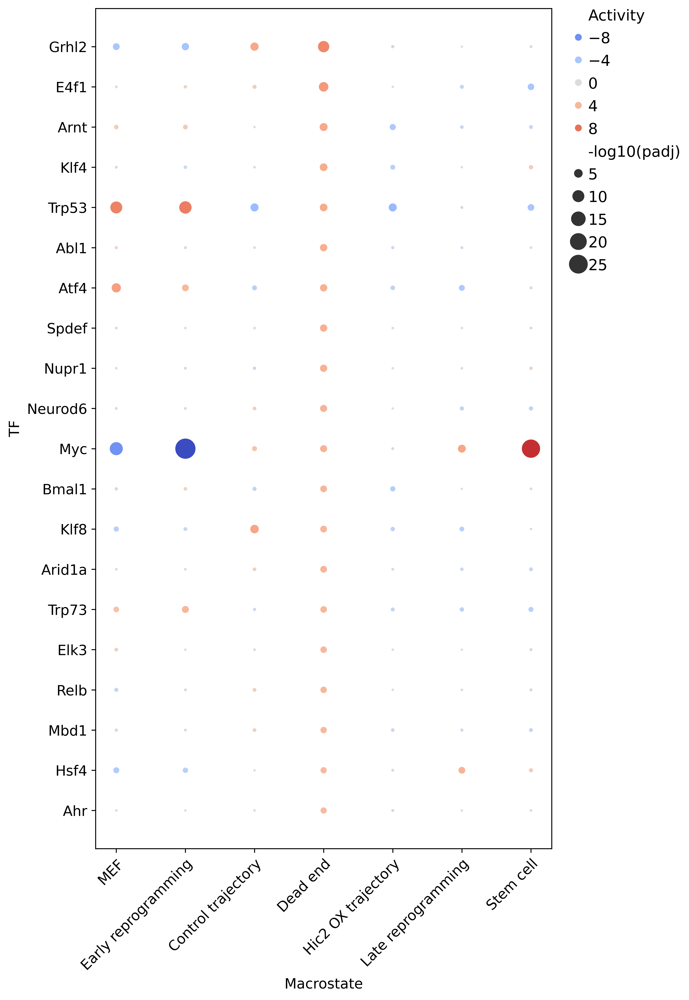

In [126]:
# TF activity in dead end

single_cell_analysis.plot_tf_activity(adata_raw, network=collectri_df, top_from="Dead end", n_top=20)

Grhl2 is a MET driver, E4f1 regulates p53, Arnt is a damage marker